<h1 align="center"><strong>Final Project - Social Graphs and Interactions</strong></h1>
<h3 align="center"><strong>Cinematic Networks: Sentiment, Temporal Dynamics, and Genre-Based Differences</strong></h3>
<p align="center">
<strong>Date:</strong> December 12th, 2024 <br>
<strong>Created by:</strong><br>
Johan Böcher Hanehøj (s194495) <br>
Melis Cemre Akyol (s232165) <br>
Md Jahidul Islam (s240010)
</p>

---

In this final project, we turn our lens towards the world of cinema. Leveraging the *Cornell Movie Dialogue Dataset* in conjunction with metadata from TMDB (The Movie Database), we seek to map the intricate networks formed by films, their characters, and the connections between them.

We will investigate how temporal changes, sentiment extracted from dialogues, and differences in genres influence the structure and patterns of these cinematic networks. Ultimately, our goal is to reveal hidden dimensions of the cinematic universe - its communities, thematic clusters, and the interplay between sentiment and genre over time.

---
All code associated with this final project can be viewed on the following [Github Reposority](https://github.com/johan-bh/Social_Graphs_ExamProject/tree/main)



### **Part 1: Data Collection and Preprocessing**

Before we dive into network construction, sentiment extraction, or temporal analysis, we must first gather and preprocess our data. This involves:

- **Integrating Multiple Sources:** Combining the Cornell Movie Dialogue Dataset with TMDB metadata.
- **Ensuring Data Integrity:** Cleaning and harmonizing entries, dealing with missing values, and standardizing formats.
- **Preparing for Analysis:** Extracting key attributes, such as cast members, genres, and dialogue lines ready for sentiment analysis.

Below, we begin by loading the Cornell dataset, exploring its size and structure, and then proceeding to integrate additional metadata from TMDB.

In [7]:
import kagglehub 
import pandas as pd
import os
import numpy as np
import ast

path = kagglehub.dataset_download("rajathmc/cornell-moviedialog-corpus")
print("Path to dataset files:", path)

# Calculate total size of data
total_size = 0
for filename in os.listdir(path):
    if filename.endswith('.txt'):
        file_size = os.path.getsize(os.path.join(path, filename))
        total_size += file_size
print(f"Total size of data: {total_size / (1024 * 1024):.2f} MB")


Path to dataset files: C:\Users\jbhan\.cache\kagglehub\datasets\rajathmc\cornell-moviedialog-corpus\versions\1
Total size of data: 40.28 MB


**Next, we load the key components of the Cornell dataset:**
- `movie_lines.txt` contains individual lines of dialogue.
- `movie_titles_metadata.txt` includes metadata about each movie.
- `movie_conversations.txt` connects sets of lines into conversations.

We will also perform initial cleaning steps such as renaming columns and stripping whitespace.


In [8]:
# Load the datasets
movie_lines = pd.read_csv(
    f"{path}/movie_lines.txt",
    sep=r' \+\+\+\$\+\+\+ ',
    header=None,
    on_bad_lines='skip',
    encoding='ISO-8859-1',
    engine='python'
)

movie_titles = pd.read_csv(
    f"{path}/movie_titles_metadata.txt",
    sep=r' \+\+\+\$\+\+\+ ',
    header=None,
    encoding='ISO-8859-1',
    engine='python',
    names=['MovieID', 'Title', 'Year', 'Rating', 'Votes', 'Genres']
)

movie_conversations = pd.read_csv(
    f"{path}/movie_conversations.txt",
    sep=r' \+\+\+\$\+\+\+ ',
    header=None,
    on_bad_lines='skip',
    encoding='ISO-8859-1',
    engine='python'
)


**Renaming columns for clarity and performing basic data transformations.**

In [9]:
# Rename columns
movie_lines.columns = ['LineID', 'CharacterID', 'MovieID', 'CharacterName', 'Text']
movie_conversations.columns = ['CharacterID1', 'CharacterID2', 'MovieID', 'Conversation']

# Strip whitespace from character IDs
movie_lines['CharacterID'] = movie_lines['CharacterID'].str.strip()
movie_conversations['CharacterID1'] = movie_conversations['CharacterID1'].str.strip()
movie_conversations['CharacterID2'] = movie_conversations['CharacterID2'].str.strip()

# Convert character IDs to strings if necessary
movie_lines['CharacterID'] = movie_lines['CharacterID'].astype(str)
movie_conversations['CharacterID1'] = movie_conversations['CharacterID1'].astype(str)
movie_conversations['CharacterID2'] = movie_conversations['CharacterID2'].astype(str)


**We will now construct dictionaries and a combined DataFrame to facilitate quick lookups of characters, their movies, and related metadata.**


In [10]:
# Create dictionaries for quick lookups
character_names = dict(zip(movie_lines['CharacterID'], movie_lines['CharacterName']))
character_movies = dict(zip(movie_lines['CharacterID'], movie_lines['MovieID']))
movie_titles_dict = dict(zip(movie_titles['MovieID'], movie_titles['Title']))

# Prepare lists for DataFrame creation
character_ids = []
character_names_list = []
movie_ids = []
movie_titles_list = []

for character_id, character_name in character_names.items():
    movie_id = character_movies.get(character_id, None)
    movie_title = movie_titles_dict.get(movie_id, None)
    
    character_ids.append(character_id)
    character_names_list.append(character_name)
    movie_ids.append(movie_id)
    movie_titles_list.append(movie_title)

df = pd.DataFrame({
    "CharacterID": character_ids,
    "CharacterName": character_names_list,
    "MovieID": movie_ids,
    "MovieTitle": movie_titles_list
})

df.head()


,CharacterID,CharacterName,MovieID,MovieTitle
0,u0,BIANCA,m0,10 things i hate about you
1,u2,CAMERON,m0,10 things i hate about you
2,u3,CHASTITY,m0,10 things i hate about you
3,u4,JOEY,m0,10 things i hate about you
4,u5,KAT,m0,10 things i hate about you


**To enrich our dataset with cast and production details, we will now integrate data from TMDB.**  
The next code cells define functions to query TMDB’s API, link characters to cast information, and unify the data.

We will:
- Use `get_movie_cast` to fetch cast details from TMDB.
- Map Cornell characters to TMDB cast to construct a unified dataset.

*Note: Make sure you have your TMDB API key ready and assigned to `API_KEY` and `BASE_URL` variables before running the next cells.*


In [12]:
from tqdm import tqdm
import time
import requests
import configparser
config = configparser.ConfigParser()
config.read('Config/config.ini')
API_KEY = config['TMDB']['API_KEY']

BASE_URL = "https://api.themoviedb.org/3"

def get_movie_cast(movie_title):
    try:
        search_url = f"{BASE_URL}/search/movie"
        response = requests.get(search_url, params={"api_key": API_KEY, "query": movie_title})
        results = response.json().get("results", [])
        if not results:
            return None

        # Get movie ID and fetch credits
        movie_id = results[0]["id"]
        credits_url = f"{BASE_URL}/movie/{movie_id}/credits"
        response = requests.get(credits_url, params={"api_key": API_KEY})
        cast = response.json().get("cast", [])
        return cast
    except Exception as e:
        print(f"Error fetching cast for {movie_title}: {e}")
        return None


**We group the Cornell characters by movie and attempt to match them to their TMDB counterparts.**


In [13]:
# Group characters by movie
movies = df.groupby("MovieTitle")["CharacterName"].apply(list).to_dict()

def extract_movie_cast(movie_title, cornell_characters):
    # Handle NaN or None values in movie title
    if pd.isna(movie_title) or movie_title is None:
        return []
    
    clean_title = str(movie_title).strip('"')
    movie_chars = cornell_characters.get(clean_title, [])
    
    # Handle NaN values in character names
    movie_chars = [str(char).lower() for char in movie_chars if pd.notna(char)]
    
    cast = get_movie_cast(clean_title)
    if cast:
        cast_info = []
        matched_cornell_chars = set()
        
        for person in cast:
            char_name = person['character'].lower()
            main_char_name = char_name.split('(')[0].split("'s")[0].strip()
            
            for cornell_char in movie_chars:
                if cornell_char not in matched_cornell_chars and (
                    cornell_char == char_name or 
                    cornell_char == main_char_name or
                    cornell_char in main_char_name.split()
                ):
                    matched_cornell_chars.add(cornell_char)
                    cast_info.append({
                        'movie_title': clean_title,
                        'character_name': person['character'],
                        'cornell_character': cornell_char.upper(),
                        'actor_name': person['name'],
                        'cast_order': person['order'],
                        'actor_id': person['id']
                    })
                    break
        return cast_info
    return []


**We now iterate over our movie set, extracting cast info using the function defined above.**  
We provide a `sample_size` parameter if we want to limit the data for testing.  
After processing, we create a DataFrame with all cast information.


In [14]:
def create_cast_dataframe(movies_dict, sample_size=None):
    all_cast = []
    
    movie_titles = list(movies_dict.keys())
    if sample_size:
        movie_titles = movie_titles[:sample_size]
    
    movie_titles = [title for title in movie_titles if pd.notna(title)]
    
    for movie_title in tqdm(movie_titles, desc="Processing movies"):
        try:
            cast_info = extract_movie_cast(movie_title, movies_dict)
            if cast_info:
                all_cast.extend(cast_info)
            # Respect API rate limits
            time.sleep(0.1)
        except Exception as e:
            print(f"Error processing movie '{movie_title}': {str(e)}")
            continue
    
    cast_df = pd.DataFrame(all_cast) if all_cast else pd.DataFrame()
    return cast_df

sample_size = None
cast_df = create_cast_dataframe(movies, sample_size)

print("\nCast DataFrame:")
print(cast_df.head())

# cast_df.to_csv("movie_casts_sample.csv", index=False)


Processing movies: 100%|██████████| 617/617 [04:01<00:00,  2.55it/s]


Cast DataFrame:
                  movie_title    character_name cornell_character  \
0  10 things i hate about you    Patrick Verona           PATRICK   
1  10 things i hate about you     Cameron James           CAMERON   
2  10 things i hate about you  Bianca Stratford            BIANCA   
3  10 things i hate about you    Michael Eckman           MICHAEL   
4  10 things i hate about you       Joey Donner              JOEY   

             actor_name  cast_order  actor_id  
0          Heath Ledger           0      1810  
1  Joseph Gordon-Levitt           2     24045  
2        Larisa Oleynik           3     40978  
3       David Krumholtz           4     38582  
4         Andrew Keegan           5     40979  


**In the following cell, we define a function `analyze_mismatches` to understand how well the Cornell characters map onto the TMDB cast for a given movie.**  
For each movie:
- It retrieves the Cornell characters.
- Compares them against the characters matched from TMDB.
- Prints a summary of how many Cornell characters remain unmatched in the TMDB data.


In [16]:
# Function to analyze mismatches for a movie 
def analyze_mismatches(movie_title, df, cast_df):
    # Get Cornell characters
    cornell_chars = set(df[df['MovieTitle'] == movie_title]['CharacterName'].str.lower())
    
    # Get TMDB matched characters (those successfully mapped)
    tmdb_chars = set(cast_df[cast_df['movie_title'] == movie_title]['cornell_character'].str.lower())
    
    # Find missing characters that do not appear in TMDB data
    missing_chars = cornell_chars - tmdb_chars
    
    print(f"\nAnalysis for: {movie_title}")
    print(f"Cornell characters: {len(cornell_chars)}")
    print(f"TMDB matched characters: {len(tmdb_chars)}")
    print(f"Missing characters: {len(missing_chars)}")
    if missing_chars:
        print("Characters not found in TMDB:")
        for char in missing_chars:
            print(f"- {char}")
    print("-" * 50)


**Next, we apply the `analyze_mismatches` function across a sample set of movies to see a summary of character coverage.**


In [17]:
# Analyze each movie in our sample
sample_movies = cast_df['movie_title'].unique()
for movie in sample_movies:
    analyze_mismatches(movie, df, cast_df)



Analysis for: 10 things i hate about you
Cornell characters: 12
TMDB matched characters: 8
Missing characters: 4
Characters not found in TMDB:
- miss perky
- bruce
- kat
- sharon
--------------------------------------------------

Analysis for: 1492: conquest of paradise
Cornell characters: 14
TMDB matched characters: 9
Missing characters: 5
Characters not found in TMDB:
- isabel
- sailor
- utapan
- arojaz
- pinzon
--------------------------------------------------

Analysis for: 15 minutes
Cornell characters: 23
TMDB matched characters: 19
Missing characters: 4
Characters not found in TMDB:
- max
- secondary officer
- robert hawkins
- immigration officer
--------------------------------------------------

Analysis for: 2001: a space odyssey
Cornell characters: 13
TMDB matched characters: 8
Missing characters: 5
Characters not found in TMDB:
- b20
- c12
- pilot
- child
- co-pilot
--------------------------------------------------

Analysis for: 48 hrs.
Cornell characters: 16
TMDB matc

As one can see in the output above there are quite a few discreptancies between the characters in the Cornell Dataset and TMDB. Thus to better understand this phenomenon we conduct further investigation on a random selection of movies. The following code attempts to verify the casts between the two sources

In [18]:
def verify_tmdb_characters(movie_title):
    print(f"\nVerifying TMDB cast for: {movie_title}")
    
    # Get full cast from TMDB
    cast = get_movie_cast(movie_title)
    if cast:
        # Print all character names from TMDB
        print("\nAll TMDB characters:")
        for person in cast:
            print(f"- {person['character']}")
            
        # Get Cornell characters for this movie
        cornell_chars = set(df[df['MovieTitle'] == movie_title]['CharacterName'].str.lower())
        print("\nCornell characters not found in any form:")
        
        # Check each Cornell character
        for cornell_char in cornell_chars:
            found = False
            for person in cast:
                tmdb_char = person['character'].lower()
                # Check various conditions of partial name matches
                if (cornell_char in tmdb_char or 
                    tmdb_char in cornell_char or 
                    any(word in tmdb_char.split() for word in cornell_char.split())):
                    found = True
                    break
            
            if not found:
                print(f"- {cornell_char}")
    else:
        print("No cast found in TMDB")
    print("-" * 50)


**Below, we use `verify_tmdb_characters` to deeply inspect a selection of movies that presented discrepancies.**  
We will look at:
- *10 things i hate about you*
- *1492: conquest of paradise*
- *15 minutes*
- *2001: a space odyssey*
  
This helps us understand specific cases and potentially guide our decisions on how to handle these mismatches in later analysis.

In [19]:
movies_to_verify = [
    '10 things i hate about you',
    '1492: conquest of paradise',
    '15 minutes',
    '2001: a space odyssey'
]

for movie in movies_to_verify:
    verify_tmdb_characters(movie)



Verifying TMDB cast for: 10 things i hate about you

All TMDB characters:
- Patrick Verona
- Katarina Stratford
- Cameron James
- Bianca Stratford
- Michael Eckman
- Joey Donner
- Mandella
- Chastity
- Walter Stratford
- Mr. Morgan
- Ms. Perky
- Mr. Chapin
- Scruvy
- Bogey Lowenstien
- Derek
- Trevor
- Audio Visual Guy
- Beautiful Jock
- Coffee Kid
- Coffee Kid
- Cohort
- Coffee Girl
- Drugged Out Loser
- Wimpy Loser
- Laughing Loser
- Crying Loser
- Screaming Loser
- Detention Student
- Bartender
- Drunken Girl
- Jock
- MBA Guy at Party
- Heather
- Clem
- Cowboy
- Kissing Guy
- Judith
- Perky Girl
- Buckaroo Bartender
- Biker
- Save Ferris Singer
- Save Ferris Singer
- Letters To Cleo Singer
- Letters To Cleo Singer

Cornell characters not found in any form:
- bruce
- sharon
--------------------------------------------------

Verifying TMDB cast for: 1492: conquest of paradise

All TMDB characters:
- Christopher Columbus
- Sanchez
- Queen Isabella
- Older Fernando
- Beatrix
- Marchen

**Note on Character Discrepancies**
The observed discrepancies in the number of characters seem to mostly arise from differences between the Cornell Movie Dialogue Dataset and the TMDB cast listings. While the Cornell dataset often includes a broad range of speaking characters - some quite minor or context-specific—TMDB’s cast data may focus more on principal and credited roles. As a result, certain secondary or non-critical characters present in the Cornell dataset are not found in TMDB’s metadata. This leads to “missing” characters that do not appear in the TMDB cast lists, reflecting a natural divergence in how the two sources document and classify film characters. E.g. from `2001: A Space Oddyssey` the missing characters are:

- b20
- c12
- pilot
- child
- co-pilot

**NB:** we deem it out of scope to attempt to mitigate these discreptancies as we still have a significant portion of the most important characters for all the movies.


**Now, let’s turn our attention to the cast data and see how diverse our actor set is.**  
We begin by counting how many unique actors are in `cast_df`.

In [15]:
# How many unique actors are in the cast_df?
len(cast_df["actor_name"].unique())

4244

### **Building and Visualizing Bipartite Actor-Movie Networks**

Up to this point, we have examined how to integrate data from multiple sources and reconcile differences between character listings. Now, we shift our focus toward constructing and analyzing the underlying networks formed by the data. In cinema, understanding the patterns of collaboration between actors and the interconnections between movies can highlight which figures and films serve as central hubs in the industry.

**What We Aim to Do:**
1. **Create Actor-Actor and Movie-Movie Networks:**  
   Using our processed `cast_df`, we can build two distinct networks:
   - An **Actor-Actor** network, where edges represent co-appearances of actors in the same movies.
   - A **Movie-Movie** network, where edges represent shared actors between different movies.

2. **Compute Network Metrics:**  
   Once we have these networks, we will:
   - Calculate various centrality measures (degree, betweenness, eigenvector).
   - Visualize the distributions of these centralities.
   - Identify top nodes (actors or movies) that stand out in terms of connectivity and influence.

3. **Bipartite Representation and Filtering:**  
   We will also construct a bipartite network connecting actors directly to movies. This will enable:
   - Filtering by minimum number of appearances for actors and minimum number of actors per movie.
   - Visualizing the network to identify patterns or clusters.
   - Computing summary statistics like density and identifying top nodes.

Below, we start by creating and analyzing the actor-actor and movie-movie networks.


In [21]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

def create_networks(cast_df):
    """Create actor-actor and movie-movie networks from the cast DataFrame."""
    print("Creating actor-actor network...")
    actor_network = nx.Graph()
    movie_groups = cast_df.groupby('movie_title')['actor_name'].apply(list)
    
    for movie, actors in tqdm(movie_groups.items(), desc="Processing movies"):
        # Remove duplicates for safety
        actors = list(set(actors))
        for i, actor1 in enumerate(actors):
            for actor2 in actors[i + 1:]:
                if actor_network.has_edge(actor1, actor2):
                    actor_network[actor1][actor2]['weight'] += 1
                else:
                    actor_network.add_edge(actor1, actor2, weight=1)
    
    print("\nCreating movie-movie network...")
    movie_network = nx.Graph()
    actor_groups = cast_df.groupby('actor_name')['movie_title'].apply(list)
    
    for actor, movies in tqdm(actor_groups.items(), desc="Processing movies"):
        # Remove duplicates for safety
        movies = list(set(movies))
        for i, movie1 in enumerate(movies):
            for movie2 in movies[i + 1:]:
                if movie_network.has_edge(movie1, movie2):
                    movie_network[movie1][movie2]['weight'] += 1
                else:
                    movie_network.add_edge(movie1, movie2, weight=1)
    
    return actor_network, movie_network

def analyze_centralities(G):
    """Calculate degree, betweenness, and eigenvector centralities."""
    print("Calculating centralities...")
    centralities = {
        'Degree': nx.degree_centrality(G),
        'Betweenness': nx.betweenness_centrality(G),
        'Eigenvector': nx.eigenvector_centrality(G, max_iter=1000)
    }
    return centralities

def plot_centrality_distributions(centralities, name):
    """Plot centrality distributions for each centrality measure."""
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f'Centrality Distributions for {name} Network', y=1.02)
    
    for ax, (measure, values) in zip(axes, centralities.items()):
        # Create histogram
        ax.hist(list(values.values()), bins=50, alpha=0.7)
        
        # Add vertical line for mean
        mean_val = np.mean(list(values.values()))
        ax.axvline(mean_val, color='r', linestyle='--', alpha=0.5)
        
        # Add statistics text
        stats_text = f'Mean: {mean_val:.3f}\nMedian: {np.median(list(values.values())):.3f}'
        ax.text(0.95, 0.95, stats_text,
                transform=ax.transAxes,
                verticalalignment='top',
                horizontalalignment='right',
                bbox=dict(facecolor='white', alpha=0.8))
        
        ax.set_title(f'{measure} Centrality')
        ax.set_xlabel('Centrality Value')
        ax.set_ylabel('Frequency')
        
        # If highly skewed, use log scale
        if np.max(list(values.values())) / np.mean(list(values.values())) > 10:
            ax.set_yscale('log')
    
    plt.tight_layout()
    plt.savefig(f'Figures/{name.lower()}_centrality_distributions.png', dpi=300, bbox_inches='tight')
    plt.close()

def print_top_nodes(centralities, name):
    """Print top 5 nodes by each centrality measure."""
    print(f"\nTop 5 {name}s by centrality measures:")
    for measure, values in centralities.items():
        print(f"\n{measure} Centrality:")
        top_nodes = sorted(values.items(), key=lambda x: x[1], reverse=True)[:5]
        for node, value in top_nodes:
            print(f"  {node}: {value:.4f}")

if __name__ == "__main__":
    # Load data
    print("Loading data...")
    cast_df = pd.read_csv("Data/movie_casts_sample.csv")
    
    # Create actor and movie networks
    actor_network, movie_network = create_networks(cast_df)
    
    # Analyze Actor Network
    print("\nAnalyzing actor network...")
    actor_centralities = analyze_centralities(actor_network)
    plot_centrality_distributions(actor_centralities, "Actor")
    print_top_nodes(actor_centralities, "Actor")
    
    # Analyze Movie Network
    print("\nAnalyzing movie network...")
    movie_centralities = analyze_centralities(movie_network)
    plot_centrality_distributions(movie_centralities, "Movie")
    print_top_nodes(movie_centralities, "Movie")
    
    print("\nAnalysis complete! Check the Figures directory for visualizations.")


Loading data...
Creating actor-actor network...


Processing movies: 573it [00:00, 14326.38it/s]



Creating movie-movie network...


Processing movies: 4237it [00:00, 507721.45it/s]


Analyzing actor network...
Calculating centralities...



Top 5 Actors by centrality measures:

Degree Centrality:
  Tom Cruise: 0.0232
  William H. Macy: 0.0230
  Robert De Niro: 0.0227
  Nicolas Cage: 0.0222
  Joan Allen: 0.0220

Betweenness Centrality:
  Paul Guilfoyle: 0.0353
  Samuel L. Jackson: 0.0345
  Jack Lemmon: 0.0305
  Harry Carey, Jr.: 0.0261
  Nicolas Cage: 0.0242

Eigenvector Centrality:
  Frances McDormand: 0.1738
  Elizabeth Peña: 0.1733
  Tony Plana: 0.1731
  Matthew McConaughey: 0.1688
  Chris Cooper: 0.1682

Analyzing movie network...
Calculating centralities...

Top 5 Movies by centrality measures:

Degree Centrality:
  true romance: 0.0727
  nixon: 0.0688
  out of sight: 0.0650
  magnolia: 0.0593
  jfk: 0.0574

Betweenness Centrality:
  jfk: 0.0482
  tombstone: 0.0406
  nixon: 0.0316
  true romance: 0.0295
  u turn: 0.0265

Eigenvector Centrality:
  bringing out the dead: 0.1664
  true romance: 0.1587
  out of sight: 0.1522
  nixon: 0.1429
  magnolia: 0.1335

Analysis complete! Check the Figures directory for visualizat

Having seen how actors co-appear in films and how movies share actors, we now turn to a more direct representation of the system. Instead of building actor-actor or movie-movie networks, we construct a bipartite network where actors and movies are two distinct sets of nodes, connected by edges that indicate appearances.

This bipartite perspective allows for more fine-grained filtering and can help us explore how the network changes as we adjust thresholds for minimum actor involvement or minimum number of actors per movie. We will visualize these networks and produce summary statistics to understand their structure better.

Loading data...

Initial distribution:
Total actors: 4237
Total movies: 573
Creating bipartite network for min_actor_movies=2, min_movie_actors=2...
Network created with 867 actors and 521 movies, and 2400 edges.
Calculating layout...


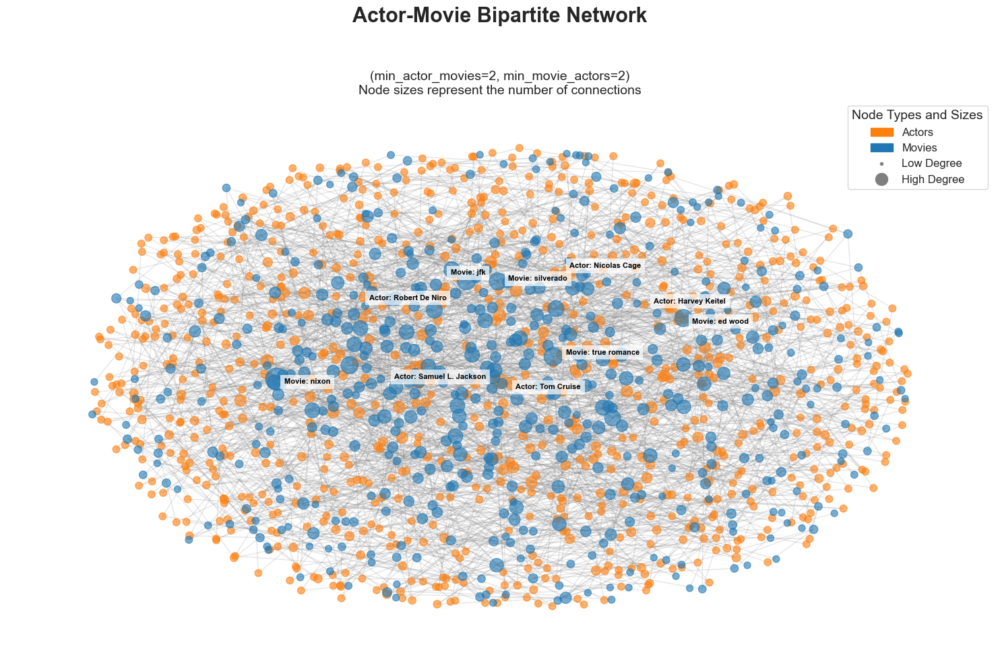


Network Metrics (min_actor_movies=2, min_movie_actors=2):
Network density: 0.0025
Top 5 most connected nodes:
Movie: nixon (Connections: 16)
Movie: true romance (Connections: 13)
Movie: jfk (Connections: 13)
Movie: silverado (Connections: 12)
Movie: ed wood (Connections: 12)
Creating bipartite network for min_actor_movies=3, min_movie_actors=2...
Network created with 353 actors and 456 movies, and 1372 edges.
Calculating layout...


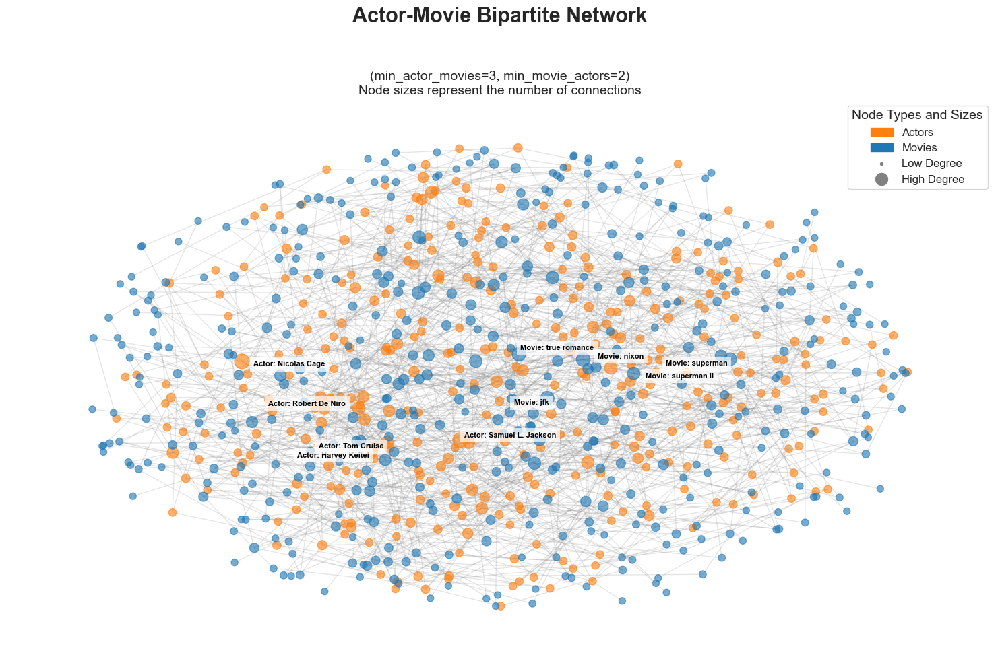


Network Metrics (min_actor_movies=3, min_movie_actors=2):
Network density: 0.0042
Top 5 most connected nodes:
Actor: Samuel L. Jackson (Connections: 10)
Actor: Nicolas Cage (Connections: 10)
Movie: nixon (Connections: 9)
Movie: true romance (Connections: 9)
Movie: jfk (Connections: 9)
Creating bipartite network for min_actor_movies=4, min_movie_actors=2...
Network created with 168 actors and 373 movies, and 819 edges.
Calculating layout...


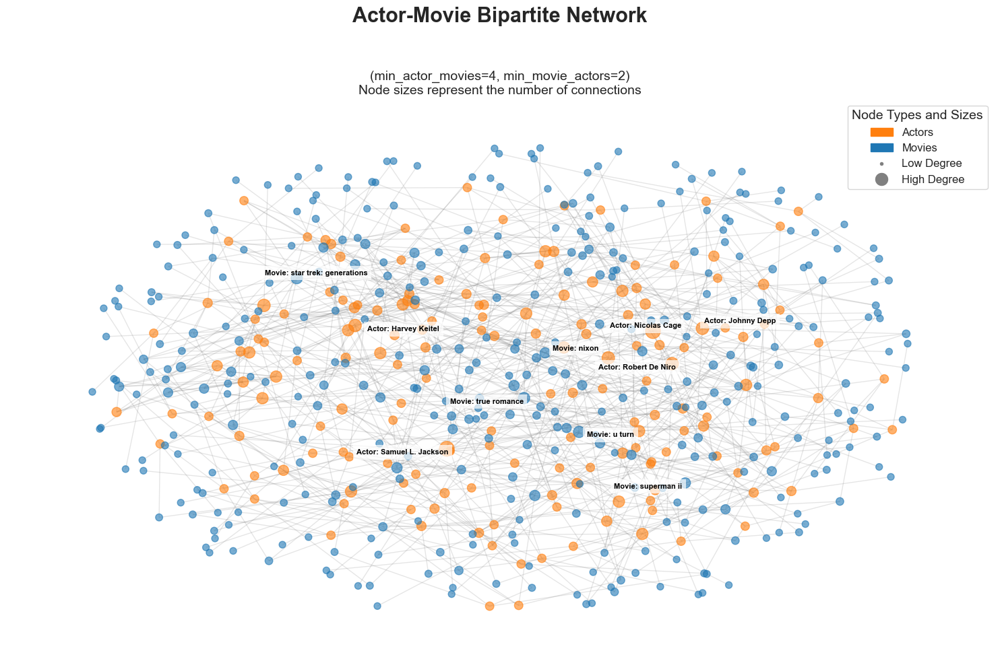


Network Metrics (min_actor_movies=4, min_movie_actors=2):
Network density: 0.0056
Top 5 most connected nodes:
Actor: Samuel L. Jackson (Connections: 10)
Actor: Nicolas Cage (Connections: 10)
Actor: Johnny Depp (Connections: 8)
Actor: Harvey Keitel (Connections: 8)
Actor: Robert De Niro (Connections: 8)
Summary statistics LaTeX table saved to Tables/summary_stats.tex


In [109]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from adjustText import adjust_text
import os

def create_and_visualize_bipartite_network(cast_df, min_actor_movies=5, min_movie_actors=5, output_filename=None):
    """Create and visualize a bipartite network of actors and movies."""
    print(f"Creating bipartite network for min_actor_movies={min_actor_movies}, min_movie_actors={min_movie_actors}...")
    
    # Filter by thresholds
    actor_counts = cast_df['actor_name'].value_counts()
    movie_counts = cast_df['movie_title'].value_counts()
    
    qualified_actors = actor_counts[actor_counts >= min_actor_movies].index
    qualified_movies = movie_counts[movie_counts >= min_movie_actors].index
    
    filtered_df = cast_df[
        cast_df['actor_name'].isin(qualified_actors) & 
        cast_df['movie_title'].isin(qualified_movies)
    ]
    
    # Create bipartite graph
    B = nx.Graph()
    actors = set(filtered_df['actor_name'])
    movies = set(filtered_df['movie_title'])
    
    B.add_nodes_from(actors, bipartite=0, node_type='actor')
    B.add_nodes_from(movies, bipartite=1, node_type='movie')
    
    edges = list(zip(filtered_df['actor_name'], filtered_df['movie_title']))
    B.add_edges_from(edges)
    
    print(f"Network created with {len(actors)} actors and {len(movies)} movies, and {len(B.edges())} edges.")
    
    if len(actors) == 0 or len(movies) == 0:
        print("No nodes meet the criteria. No visualization created.")
        return B
    
    print("Calculating layout...")
    pos = nx.spring_layout(B, k=0.3, iterations=50, seed=42)
    
    # Calculate node sizes
    actor_degrees = dict(B.degree(actors))
    movie_degrees = dict(B.degree(movies))
    actor_sizes = [50 + (actor_degrees[node] ** 2) * 2 for node in actors]
    movie_sizes = [50 + (movie_degrees[node] ** 2) * 2 for node in movies]
    
    plt.figure(figsize=(15, 10))
    ax = plt.gca()
    ax.set_facecolor('white')
    
    # Draw edges
    nx.draw_networkx_edges(B, pos, edge_color='gray', alpha=0.2, width=1)
    
    # Draw actor nodes
    nx.draw_networkx_nodes(B, pos,
                           nodelist=actors,
                           node_color='#ff7f0e',
                           node_size=actor_sizes,
                           alpha=0.6,
                           label='Actors')
    
    # Draw movie nodes
    nx.draw_networkx_nodes(B, pos,
                           nodelist=movies,
                           node_color='#1f77b4',
                           node_size=movie_sizes,
                           alpha=0.6,
                           label='Movies')
    
    # Label top actors and movies
    top_actors = sorted(actor_degrees.items(), key=lambda x: x[1], reverse=True)[:5]
    top_movies = sorted(movie_degrees.items(), key=lambda x: x[1], reverse=True)[:5]
    
    texts = []
    for node, degree in top_actors:
        x, y = pos[node]
        text = plt.text(x, y, f"Actor: {node}", fontsize=8, fontweight='bold', color='black',
                        horizontalalignment='center', verticalalignment='center',
                        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
        texts.append(text)
    for node, degree in top_movies:
        x, y = pos[node]
        text = plt.text(x, y, f"Movie: {node}", fontsize=8, fontweight='bold', color='black',
                        horizontalalignment='center', verticalalignment='center',
                        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
        texts.append(text)
    
    adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))
    
    plt.suptitle("Actor-Movie Bipartite Network", fontsize=22, fontweight='bold')
    plt.title(f"(min_actor_movies={min_actor_movies}, min_movie_actors={min_movie_actors})\n"
              "Node sizes represent the number of connections", fontsize=14)
    
    # Legend
    size_legend = [
        Line2D([0], [0], marker='o', color='w', label='Low Degree', markerfacecolor='gray', markersize=5),
        Line2D([0], [0], marker='o', color='w', label='High Degree', markerfacecolor='gray', markersize=15)
    ]
    actor_patch = mpatches.Patch(color='#ff7f0e', label='Actors')
    movie_patch = mpatches.Patch(color='#1f77b4', label='Movies')
    legend_elements = [actor_patch, movie_patch] + size_legend
    
    plt.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1, 1),
               fontsize=12, title='Node Types and Sizes', title_fontsize=14)
    
    plt.axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    if output_filename:
        os.makedirs(os.path.dirname(output_filename), exist_ok=True)
        print(f"Saving visualization to {output_filename}...")
        plt.savefig(output_filename, dpi=300, bbox_inches='tight')
    
    plt.show()
    return B

if __name__ == "__main__":
    # Load the dataset
    print("Loading data...")
    file_path = r"Data/movie_casts_sample.csv"
    cast_df = pd.read_csv(file_path)
    
    print("\nInitial distribution:")
    print(f"Total actors: {len(cast_df['actor_name'].unique())}")
    print(f"Total movies: {len(cast_df['movie_title'].unique())}")
    
    os.makedirs("Tables", exist_ok=True)
    summary_data = []

    for min_collab in [2, 3, 4]:
        B = create_and_visualize_bipartite_network(
            cast_df, 
            min_actor_movies=min_collab, 
            min_movie_actors=2
        )
        
        num_actors = len([n for n, d in B.nodes(data=True) if d.get('node_type') == 'actor'])
        num_movies = len([n for n, d in B.nodes(data=True) if d.get('node_type') == 'movie'])
        num_edges = B.number_of_edges()
        density = nx.density(B)
        
        summary_data.append({
            'min_actor_movies': min_collab,
            'min_movie_actors': 2,
            'num_actors': num_actors,
            'num_movies': num_movies,
            'num_edges': num_edges,
            'density': density
        })
        
        print(f"\nNetwork Metrics (min_actor_movies={min_collab}, min_movie_actors=2):")
        if len(B) > 0:
            print(f"Network density: {density:.4f}")
            degrees = dict(B.degree())
            top_nodes = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:5]
            print("Top 5 most connected nodes:")
            for node, degree in top_nodes:
                node_type = 'Actor' if B.nodes[node]['node_type'] == 'actor' else 'Movie'
                print(f"{node_type}: {node} (Connections: {degree})")
        else:
            print("No network to report metrics on.")
    
    summary_df = pd.DataFrame(summary_data)
    latex_table = summary_df.to_latex(index=False, float_format="%.4f")
    
    with open("Tables/summary_stats.tex", "w") as f:
        f.write(latex_table)
    
    print("Summary statistics LaTeX table saved to Tables/summary_stats.tex")


In the following steps, we compare the structure of our real bipartite network to synthetic networks (e.g., Barabási–Albert and random graphs) and compute various metrics like clustering, modularity, and degree distributions. This helps us understand how our observed cinematic network stacks up against theoretical models and gives further insight into the underlying generative processes of the network’s structure.

Original: 0.0, Random: 0.0011850311850311848, BA: 0.01893920103627065
Modularity: 0.8350607691317282
Calculating best minimal value for power law fit
Power law alpha: 7.981168092730613, Lognormal sigma: 1.0524506891812944
Weighted Average Path Length: 7.525360607914051
Average Path Length (Largest Connected Component): 7.990495369590977


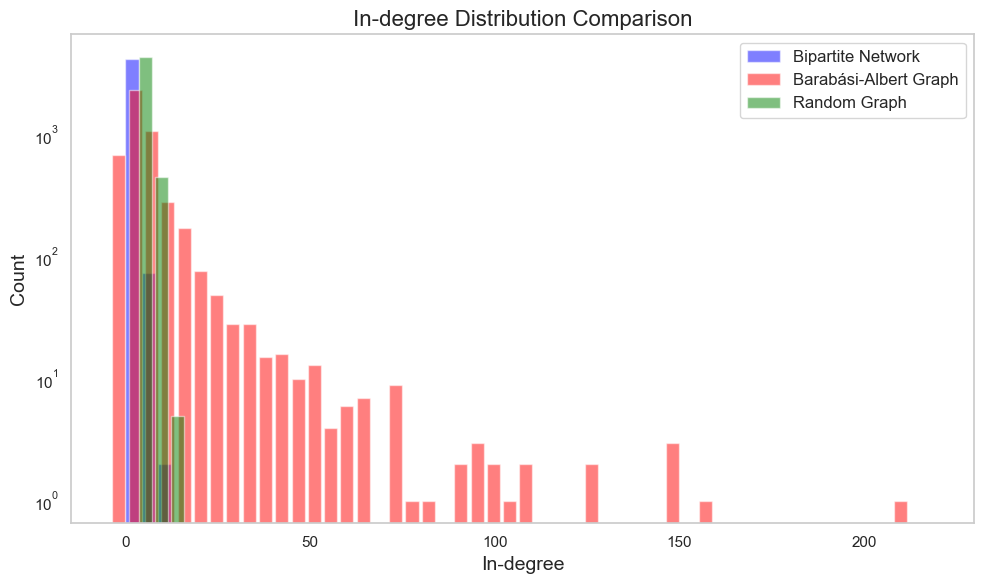

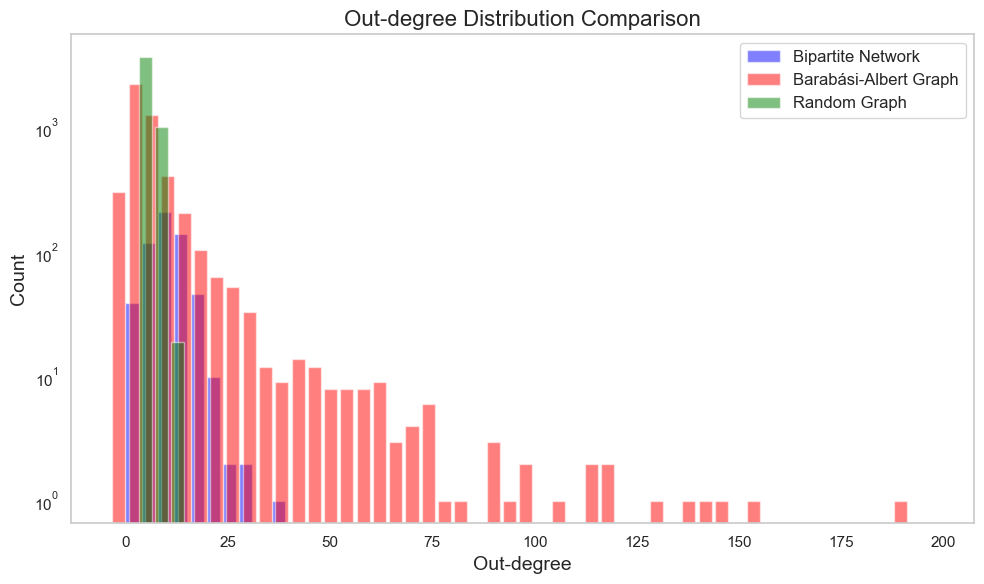

In [23]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from community import community_louvain
import powerlaw

sns.set(style="whitegrid")

# Load the bipartite graph dataset
file_path = r"Data\movie_casts_sample.csv"
movie_casts = pd.read_csv(file_path)

# Build bipartite graph
B = nx.Graph()
movies = movie_casts['movie_title'].unique()
actors = movie_casts['actor_name'].unique()

B.add_nodes_from(movies, bipartite=0)  # Movie nodes
B.add_nodes_from(actors, bipartite=1)  # Actor nodes

for _, row in movie_casts.iterrows():
    B.add_edge(row['movie_title'], row['actor_name'])

# Compute degrees
actor_degrees = [B.degree(n) for n in actors]
movie_degrees = [B.degree(n) for n in movies]

# Generate comparison graphs
n = len(movies) + len(actors)
m = B.number_of_edges()
ba_graph = nx.barabasi_albert_graph(n, max(1, m // len(movies)))
random_graph = nx.gnm_random_graph(n, m)

# Convert BA to directed for in/out-degree testing
directed_ba_graph = nx.DiGraph()
for u, v in ba_graph.edges():
    if np.random.rand() > 0.5:
        directed_ba_graph.add_edge(u, v)
    else:
        directed_ba_graph.add_edge(v, u)

ba_in_degrees = [directed_ba_graph.in_degree(n) for n in directed_ba_graph.nodes()]
ba_out_degrees = [directed_ba_graph.out_degree(n) for n in directed_ba_graph.nodes()]
random_in_degrees = [random_graph.degree(n) for n in random_graph.nodes()]

original_clustering = nx.average_clustering(B)
random_clustering = nx.average_clustering(random_graph)
ba_clustering = nx.average_clustering(ba_graph)
print(f"Original: {original_clustering}, Random: {random_clustering}, BA: {ba_clustering}")

partition = community_louvain.best_partition(B)
modularity = community_louvain.modularity(partition, B)
print(f"Modularity: {modularity}")

degree_data = [d for n, d in B.degree()]
fit = powerlaw.Fit(degree_data)
print(f"Power law alpha: {fit.alpha}, Lognormal sigma: {fit.sigma}")

components = [B.subgraph(c).copy() for c in nx.connected_components(B)]
component_path_lengths = [nx.average_shortest_path_length(component) for component in components]
total_nodes = sum(len(c) for c in components)
weighted_avg_path_length = sum(len(c) * nx.average_shortest_path_length(c) for c in components) / total_nodes
print(f"Weighted Average Path Length: {weighted_avg_path_length}")

largest_cc = max(nx.connected_components(B), key=len)
largest_cc_subgraph = B.subgraph(largest_cc).copy()
avg_path_length = nx.average_shortest_path_length(largest_cc_subgraph)
print(f"Average Path Length (Largest Connected Component): {avg_path_length}")

def plot_degree_distributions(real_data, ba_data, random_data, title, xlabel):
    num_bins = 50
    bins = np.linspace(0, max(max(real_data), max(ba_data), max(random_data)), num_bins)
    real_hist, _ = np.histogram(real_data, bins=bins)
    ba_hist, _ = np.histogram(ba_data, bins=bins)
    random_hist, _ = np.histogram(random_data, bins=bins)

    fig, ax = plt.subplots(figsize=(10, 6))
    bar_width = (bins[1] - bins[0]) * 0.8

    ax.bar(bins[:-1], real_hist, width=bar_width, color="blue", alpha=0.5, label="Bipartite Network", align='edge')
    ax.bar(bins[:-1] - bar_width, ba_hist, width=bar_width, color="red", alpha=0.5, label="Barabási-Albert Graph", align='edge')
    ax.bar(bins[:-1] + bar_width, random_hist, width=bar_width, color="green", alpha=0.5, label="Random Graph", align='edge')

    ax.set_title(title, fontsize=16)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel("Count", fontsize=14)
    ax.set_yscale("log")
    ax.legend(fontsize=12)
    ax.grid(False)

    plt.tight_layout()
    plt.savefig(f'Figures/{title.replace(" ", "_")}_degree_distribution.png', dpi=300)
    plt.show()

plot_degree_distributions(actor_degrees, ba_in_degrees, random_in_degrees, "In-degree Distribution Comparison", "In-degree")
plot_degree_distributions(movie_degrees, ba_out_degrees, random_in_degrees, "Out-degree Distribution Comparison", "Out-degree")


We have successfully:
- Constructed actor-actor and movie-movie networks and examined their centralities.
- Built a bipartite network to visualize and analyze how network structure changes with filtering criteria.
- Compared our real network’s degree distributions and clustering patterns to synthetic networks.

This approach helps us understand the underlying complexities and dynamics of the cinematic landscape, revealing how collaboration and film production patterns may differ from theoretical network models.

### **Clustering Analysis of Actor-Actor and Movie-Movie Networks**

In this section, we focus on detecting communities within our Actor-Actor and Movie-Movie networks. By applying the Louvain algorithm, we aim to understand the modular structure that emerges when actors are linked through their co-appearances in films and when movies are linked through their shared actors.

**Key Steps:**

1. **Building the Networks:**  
   - **Actor-Actor Network:** Nodes represent actors, and edges represent co-occurrences in the same movie.
   - **Movie-Movie Network:** Nodes represent movies, and edges represent shared actors.

2. **Community Detection (Louvain):**  
   We use the Louvain algorithm to detect communities. This algorithm aims to maximize the network's modularity—a measure of how well the network is divided into communities, with many edges within communities and few between them.

3. **Visualizing the Top Communities:**  
   We identify the largest communities, select top nodes by degree from these communities, and visualize them with color-coding.

4. **Computing Metrics and Creating Summary Tables:**  
   We compute metrics like density, average clustering, and degree distributions. Finally, we summarize the results and save them to a LaTeX table.

---


In [24]:
import networkx as nx
import pandas as pd
from community import community_louvain
import collections
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import os
from adjustText import adjust_text

# Ensure the Figures and Tables directories exist
os.makedirs('Figures', exist_ok=True)
os.makedirs('Tables', exist_ok=True)

# Load dataset
file_path = r"Data\movie_casts_sample.csv"
cast_df = pd.read_csv(file_path)
print("Data loaded successfully!")
print(f"Number of unique actors: {cast_df['actor_name'].nunique()}")
print(f"Number of unique movies: {cast_df['movie_title'].nunique()}")


Data loaded successfully!
Number of unique actors: 4237
Number of unique movies: 573


**Building the Actor-Actor Network**

We construct the Actor-Actor network by:
1. Grouping actors by movie.
2. Counting how many times each pair of actors co-appear.
3. Adding edges weighted by the number of co-appearances.


In [25]:
def create_actor_actor_network(cast_df):
    actor_network = nx.Graph()
    print("\nCreating actor-actor network...")
    movie_groups = cast_df.groupby('movie_title')['actor_name'].apply(list)
    
    collaborations = {}
    for movie, actors in tqdm(movie_groups.items(), desc="Processing movies"):
        actors = list(set(actors))
        for i, actor1 in enumerate(actors):
            for actor2 in actors[i + 1:]:
                pair = tuple(sorted([actor1, actor2]))
                collaborations[pair] = collaborations.get(pair, 0) + 1

    for (actor1, actor2), weight in collaborations.items():
        actor_network.add_edge(actor1, actor2, weight=weight)
    
    return actor_network

actor_network = create_actor_actor_network(cast_df)
print(f"Actor-Actor network created with {actor_network.number_of_nodes()} nodes and {actor_network.number_of_edges()} edges.")



Creating actor-actor network...


Processing movies: 573it [00:00, 37447.98it/s]

Actor-Actor network created with 4226 nodes and 31961 edges.


**Building the Movie-Movie Network**

Similarly, for the Movie-Movie network:
1. Group movies by actor.
2. Count how many times each pair of movies share actors.
3. Add edges weighted by the number of shared actors.


In [26]:
def create_movie_movie_network(cast_df):
    movie_network = nx.Graph()
    print("\nCreating movie-movie network...")
    actor_groups = cast_df.groupby('actor_name')['movie_title'].apply(list)
    
    shared_actors = {}
    for actor, movies in tqdm(actor_groups.items(), desc="Processing actors"):
        movies = list(set(movies))
        for i, movie1 in enumerate(movies):
            for movie2 in movies[i + 1:]:
                pair = tuple(sorted([movie1, movie2]))
                shared_actors[pair] = shared_actors.get(pair, 0) + 1
    
    for (movie1, movie2), weight in shared_actors.items():
        movie_network.add_edge(movie1, movie2, weight=weight)
    
    return movie_network

movie_network = create_movie_movie_network(cast_df)
print(f"Movie-Movie network created with {movie_network.number_of_nodes()} nodes and {movie_network.number_of_edges()} edges.")



Creating movie-movie network...


Processing actors: 4237it [00:00, 673179.52it/s]

Movie-Movie network created with 524 nodes and 2552 edges.


**Community Detection and Visualization**

We will:
- Apply the Louvain algorithm to detect communities in each network.
- Print the number and sizes of communities.
- Compute the network’s modularity score.
- Identify the top communities and their prominent nodes (by degree).
- Visualize a subgraph of top nodes from the top communities.



Analyzing Actor communities...

Actor Community Detection Results:
Number of communities detected: 103

Top 5 community sizes:
Community 54: 161 nodes
Community 33: 150 nodes
Community 11: 112 nodes
Community 5: 88 nodes
Community 1: 87 nodes
Community modularity: 0.7605


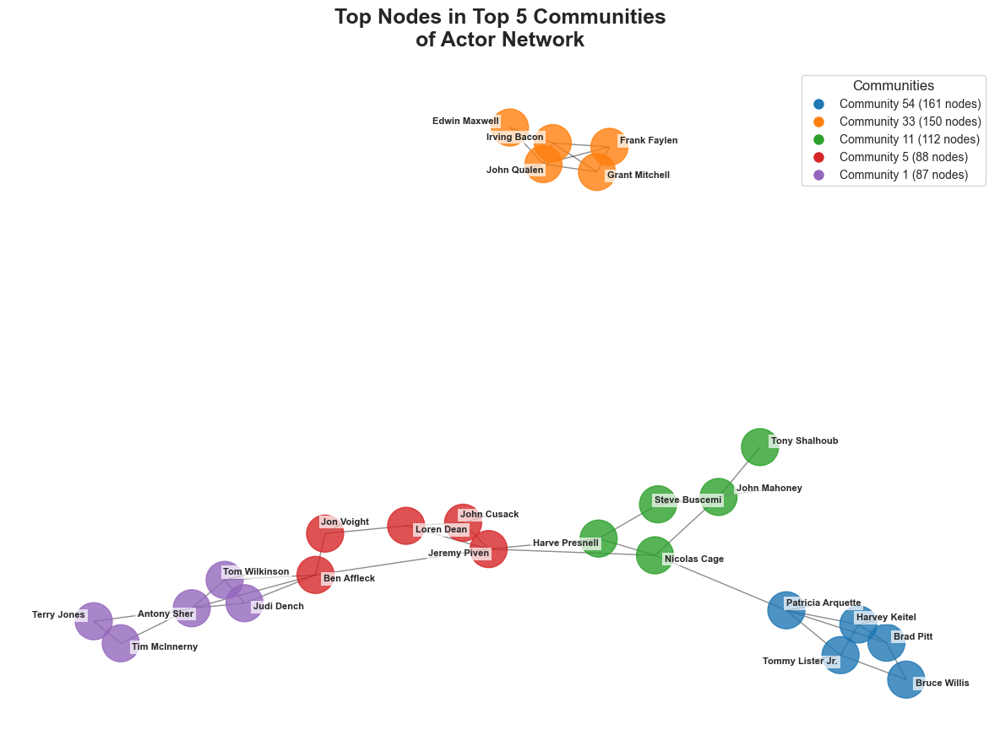


Analyzing Movie communities...

Movie Community Detection Results:
Number of communities detected: 34

Top 5 community sizes:
Community 0: 26 nodes
Community 2: 26 nodes
Community 16: 24 nodes
Community 8: 23 nodes
Community 33: 23 nodes
Community modularity: 0.4371


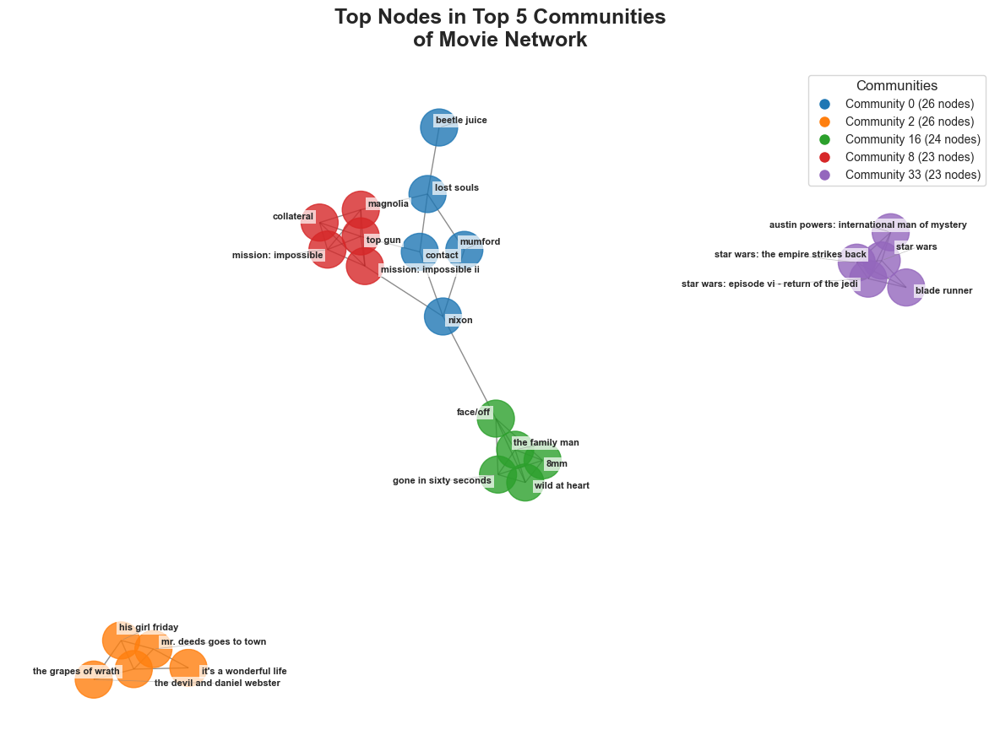

In [28]:
def analyze_communities(G, name):
    print(f"\nAnalyzing {name} communities...")
    
    # Detect communities
    communities = community_louvain.best_partition(G, weight='weight')
    n_communities = len(set(communities.values()))
    community_sizes = collections.Counter(communities.values())
    
    print(f"\n{name} Community Detection Results:")
    print(f"Number of communities detected: {n_communities}")
    
    # Get top N largest communities
    top_n_communities = 5
    top_communities = sorted(community_sizes.items(), key=lambda x: x[1], reverse=True)[:top_n_communities]
    print(f"\nTop {top_n_communities} community sizes:")
    for comm_id, size in top_communities:
        print(f"Community {comm_id}: {size} nodes")
    
    # Calculate modularity
    modularity = community_louvain.modularity(communities, G)
    print(f"Community modularity: {modularity:.4f}")
    
    # Build a subgraph with top nodes from each of the top communities
    top_nodes = []
    for comm_id, _ in top_communities:
        nodes_in_comm = [node for node, comm in communities.items() if comm == comm_id]
        subgraph = G.subgraph(nodes_in_comm)
        degrees = subgraph.degree()
        top_nodes_in_comm = sorted(degrees, key=lambda x: x[1], reverse=True)[:5]
        top_nodes.extend([node for node, _ in top_nodes_in_comm])
    
    top_nodes_subgraph = G.subgraph(top_nodes)
    
    # Assign colors
    color_palette = plt.get_cmap('tab10')
    top_communities_ids = [comm_id for comm_id, _ in top_communities]
    community_color_map = {comm_id: color_palette(i) for i, comm_id in enumerate(top_communities_ids)}
    
    node_colors = []
    for node in top_nodes_subgraph.nodes():
        comm_id = communities[node]
        node_colors.append(community_color_map[comm_id])
    
    # Layout and visualization
    pos = nx.spring_layout(top_nodes_subgraph, seed=42)
    plt.figure(figsize=(12, 9))
    nx.draw_networkx_edges(top_nodes_subgraph, pos, alpha=0.5, width=1)
    nx.draw_networkx_nodes(top_nodes_subgraph, pos, node_color=node_colors, node_size=1000, alpha=0.8)
    
    texts = []
    for node in top_nodes_subgraph.nodes():
        x, y = pos[node]
        text = plt.text(x, y, node, fontsize=8, fontweight='bold', horizontalalignment='center', verticalalignment='center',
                        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, pad=2))
        texts.append(text)
    
    adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5, alpha=0.5), expand_points=(1.5, 1.5))
    
    legend_elements = []
    for comm_id, size in top_communities:
        legend_elements.append(
            plt.Line2D([0], [0], marker='o', color='w', label=f'Community {comm_id} ({size} nodes)',
                       markerfacecolor=community_color_map[comm_id], markersize=10)
        )
    plt.legend(handles=legend_elements, loc='upper right', title='Communities', fontsize=10)
    
    plt.title(f"Top Nodes in Top {top_n_communities} Communities\nof {name} Network", pad=20, fontsize=18, fontweight='bold')
    plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(f'Figures/{name.lower()}_top_nodes_in_communities.png', dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()
    
    return communities, community_sizes, modularity

actor_communities, actor_sizes, actor_modularity = analyze_communities(actor_network, "Actor")
movie_communities, movie_sizes, movie_modularity = analyze_communities(movie_network, "Movie")


**Computing and Printing Network Metrics**

We compute:
- Density
- Average clustering coefficient
- Degree distribution stats (min, max, median)
- Top central nodes

These metrics help us understand the structure and cohesiveness of our networks.


In [29]:
def compute_network_metrics(G):
    if len(G) == 0:
        return {
            'density': 0.0,
            'avg_clustering': 0.0,
            'avg_degree': 0.0,
            'min_degree': 0,
            'max_degree': 0,
            'median_degree': 0
        }
    density = nx.density(G)
    avg_clustering = nx.average_clustering(G)
    avg_degree = sum(dict(G.degree()).values()) / len(G) if len(G) > 0 else 0
    degrees = [d for n, d in G.degree()]
    min_degree = min(degrees) if degrees else 0
    max_degree = max(degrees) if degrees else 0
    median_degree = np.median(degrees) if degrees else 0
    return {
        'density': density,
        'avg_clustering': avg_clustering,
        'avg_degree': avg_degree,
        'min_degree': min_degree,
        'max_degree': max_degree,
        'median_degree': median_degree
}

def print_network_metrics(G, name):
    print(f"\n{name} Network Metrics:")
    metrics = compute_network_metrics(G)
    print(f"Network density: {metrics['density']:.4f}")
    print(f"Average clustering coefficient: {metrics['avg_clustering']:.4f}")
    print(f"Average degree: {metrics['avg_degree']:.2f}")
    print("Degree statistics:")
    print(f"  Min degree: {metrics['min_degree']}")
    print(f"  Max degree: {metrics['max_degree']}")
    print(f"  Median degree: {metrics['median_degree']:.1f}")
    
    if len(G) > 0:
        centrality = nx.degree_centrality(G)
        top_nodes = sorted(centrality.items(), key=lambda x: x[1], reverse=True)[:5]
        print("\nMost central nodes:")
        for node, cent in top_nodes:
            print(f"  {node}: {cent:.4f}")

print_network_metrics(actor_network, "Actor")
print_network_metrics(movie_network, "Movie")



Actor Network Metrics:
Network density: 0.0036
Average clustering coefficient: 0.8832
Average degree: 15.13
Degree statistics:
  Min degree: 1
  Max degree: 98
  Median degree: 12.0

Most central nodes:
  Tom Cruise: 0.0232
  William H. Macy: 0.0230
  Robert De Niro: 0.0227
  Nicolas Cage: 0.0222
  Joan Allen: 0.0220

Movie Network Metrics:
Network density: 0.0186
Average clustering coefficient: 0.2911
Average degree: 9.74
Degree statistics:
  Min degree: 1
  Max degree: 38
  Median degree: 8.0

Most central nodes:
  true romance: 0.0727
  nixon: 0.0688
  out of sight: 0.0650
  magnolia: 0.0593
  jfk: 0.0574


**Community Size Distribution**

We plot the size distribution of the detected communities on a log scale to understand how community sizes are distributed. We also annotate the figure with key statistics such as the largest community size, median size, and modularity.


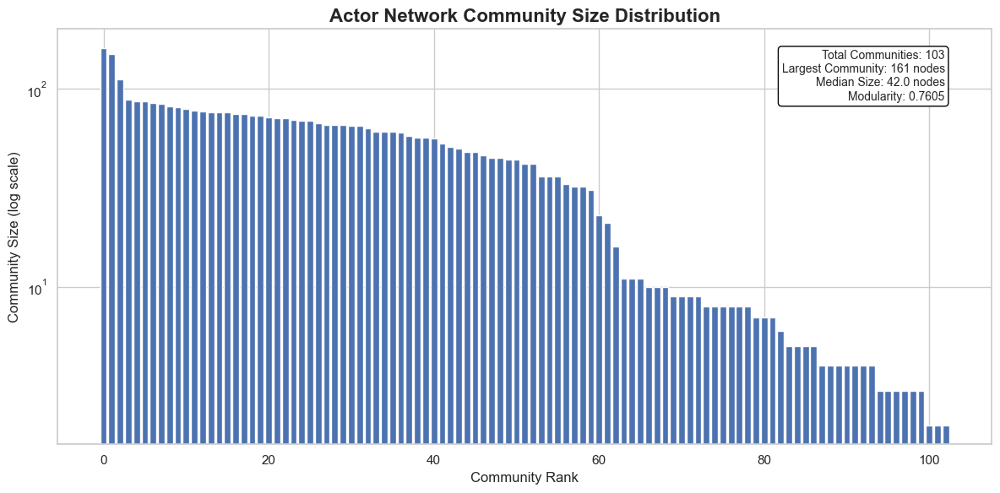

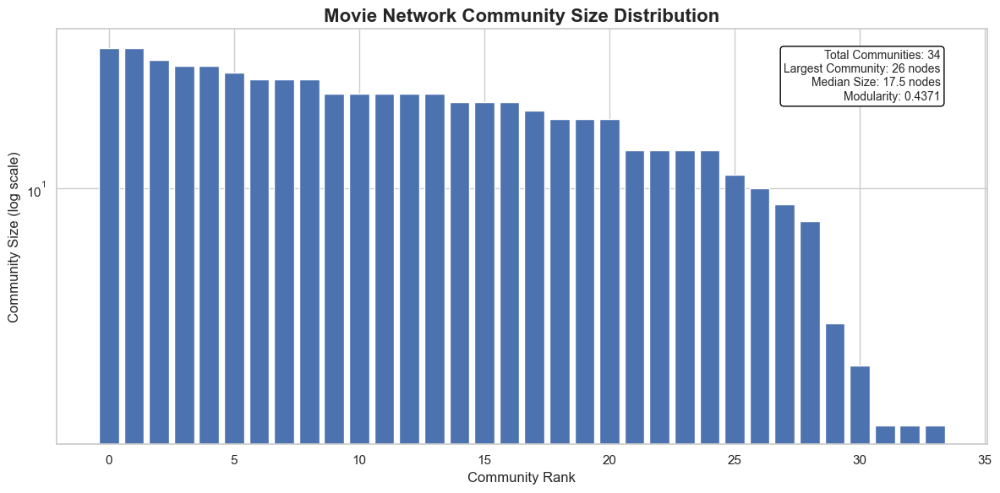

In [30]:
def plot_community_size_distribution(community_sizes, modularity, name):
    sizes = sorted(community_sizes.values(), reverse=True)
    
    n_communities = len(sizes)
    largest = max(sizes) if sizes else 0
    median_size = np.median(sizes) if sizes else 0
    
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.bar(range(n_communities), sizes)
    ax.set_yscale('log')
    ax.set_xlabel("Community Rank")
    ax.set_ylabel("Community Size (log scale)")
    ax.set_title(f"{name} Network Community Size Distribution", fontsize=16, fontweight='bold')
    
    textstr = (f"Total Communities: {n_communities}\n"
               f"Largest Community: {largest} nodes\n"
               f"Median Size: {median_size} nodes\n"
               f"Modularity: {modularity:.4f}")
    props = dict(boxstyle='round', facecolor='white', edgecolor='black', alpha=1.0)
    ax.text(0.95, 0.95, textstr, transform=ax.transAxes, fontsize=10,
            verticalalignment='top', horizontalalignment='right', bbox=props)
    
    plt.tight_layout()
    plt.savefig(f"Figures/{name.lower()}_community_size_distribution.png", dpi=300, bbox_inches='tight')
    plt.show()

plot_community_size_distribution(actor_sizes, actor_modularity, "Actor")
plot_community_size_distribution(movie_sizes, movie_modularity, "Movie")


**Creating a Summary Table**

We compile our findings (number of nodes, edges, communities, modularity, etc.) into a summary table, which is saved as a LaTeX file for future inclusion in reports.


In [31]:
from IPython.display import Markdown, display

actor_metrics = compute_network_metrics(actor_network)
movie_metrics = compute_network_metrics(movie_network)

actor_data = {
    'Network': 'Actor',
    'Nodes': actor_network.number_of_nodes(),
    'Edges': actor_network.number_of_edges(),
    'Communities': len(set(actor_communities.values())),
    'Modularity': actor_modularity,
    'Density': actor_metrics['density'],
    'Avg Degree': actor_metrics['avg_degree'],
    'Avg Clustering': actor_metrics['avg_clustering'],
    'Max Degree': actor_metrics['max_degree']
}

movie_data = {
    'Network': 'Movie',
    'Nodes': movie_network.number_of_nodes(),
    'Edges': movie_network.number_of_edges(),
    'Communities': len(set(movie_communities.values())),
    'Modularity': movie_modularity,
    'Density': movie_metrics['density'],
    'Avg Degree': movie_metrics['avg_degree'],
    'Avg Clustering': movie_metrics['avg_clustering'],
    'Max Degree': movie_metrics['max_degree']
}

summary_df = pd.DataFrame([actor_data, movie_data])
latex_table_content = summary_df.to_latex(index=False, float_format="%.4f")

latex_table = (
r"\begin{table}[h]\centering" + "\n"
r"\caption{Summary statistics for Louvain communities of the Actor and Movie Networks.}" + "\n"
r"\label{tab:community_summary_stats}" + "\n"
+ latex_table_content +
"\n\\end{table}"
)

display(Markdown(summary_df.to_markdown(index=False)))

| Network   |   Nodes |   Edges |   Communities |   Modularity |    Density |   Avg Degree |   Avg Clustering |   Max Degree |
|:----------|--------:|--------:|--------------:|-------------:|-----------:|-------------:|-----------------:|-------------:|
| Actor     |    4226 |   31961 |           103 |     0.760545 | 0.00358009 |     15.1259  |         0.883225 |           98 |
| Movie     |     524 |    2552 |            34 |     0.437077 | 0.0186242  |      9.74046 |         0.291115 |           38 |

**Conclusion:**

In this section, we:
- Constructed actor-actor and movie-movie networks.
- Used the Louvain algorithm to detect communities.
- Analyzed and visualized the largest communities.
- Calculated various network metrics, from modularity to clustering.
- Summarized findings in both visual and tabular formats.

This clustering analysis provides insight into the latent structures within the cinematic network, highlighting groups of closely connected actors or films and how these clusters vary in size and internal connectivity.

### **Semantic Clustering: Data Loading, Preprocessing, and Analysis**

We will now move towards an approach focused on semantic clustering and sentiment analysis of movie dialogues. Since our script is quite extensive, we will break it down into multiple cells. Each cell will contain a related set of functions or steps, accompanied by an explanatory markdown block that describes the purpose and logic of the code. After each code cell, we provide a small "bridge" section that leads into the next cell.

In this analysis, we:

- Load and preprocess the Cornell Movie Dialog dataset.
- Construct and analyze networks of character interactions with sentiment-encoded edges.
- Compute and visualize average sentiment arcs and compare top/bottom sets of movies.
- Eventually, we extend these analyses to genre-level comparisons and advanced network metrics.

We import all the necessary libraries and ensure our directories for figures exist. This setup cell provides the environment upon which subsequent cells will build.

In [53]:
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from nltk.sentiment import SentimentIntensityAnalyzer
import os
import kagglehub
import ast
import nltk
from scipy.stats import mannwhitneyu, skew, kurtosis
from nltk.corpus import stopwords
import string
from adjustText import adjust_text
import community.community_louvain as community_louvain  # For Louvain clustering
# supress user warnings
import warnings
warnings.filterwarnings("ignore")


nltk.download('vader_lexicon')  # Ensure VADER is available
os.makedirs('Figures', exist_ok=True)  # Create a directory for figures if not already present


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\jbhan\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


The `load_movie_data()` function:
- Downloads the Cornell Movie Dialog corpus using `kagglehub`.
- Loads movie lines, conversations, and titles into DataFrames.
- Cleans and normalizes conversation texts.
- Constructs a combined conversation text field.

This function returns three DataFrames: 
- `movie_lines`, containing individual dialogue lines.
- `movie_conversations`, containing sets of lines that form a conversation.
- `movie_titles`, containing movie metadata.

In [33]:
def load_movie_data():
    """Load and preprocess the Cornell Movie Dialog Corpus."""
    print("Loading movie dialog dataset...")
    path = kagglehub.dataset_download("rajathmc/cornell-moviedialog-corpus")
    
    # Load movie lines
    movie_lines = pd.read_csv(
        f"{path}/movie_lines.txt", 
        sep=r' \+\+\+\$\+\+\+ ',
        header=None,
        on_bad_lines='skip',
        encoding='ISO-8859-1',
        engine='python'
    )
    movie_lines.columns = ['LineID', 'CharacterID', 'MovieID', 'CharacterName', 'Text']
    
    # Load movie conversations
    movie_conversations = pd.read_csv(
        f"{path}/movie_conversations.txt", 
        sep=r' \+\+\+\$\+\+\+ ',
        header=None,
        on_bad_lines='skip',
        encoding='ISO-8859-1',
        engine='python'
    )
    movie_conversations.columns = ['CharacterID1', 'CharacterID2', 'MovieID', 'Conversation']
    
    # Load movie titles and metadata
    movie_titles = pd.read_csv(
        f"{path}/movie_titles_metadata.txt",
        sep=r' \+\+\+\$\+\+\+ ',
        header=None,
        encoding='ISO-8859-1',
        engine='python'
    )
    movie_titles.columns = ['MovieID', 'Title', 'Year', 'Rating', 'Votes', 'Genres']
    
    # Clean data
    movie_lines['CharacterID'] = movie_lines['CharacterID'].str.strip()
    movie_conversations['CharacterID1'] = movie_conversations['CharacterID1'].str.strip()
    movie_conversations['CharacterID2'] = movie_conversations['CharacterID2'].str.strip()
    movie_lines['CharacterID'] = movie_lines['CharacterID'].astype(str)
    movie_conversations['CharacterID1'] = movie_conversations['CharacterID1'].astype(str)
    movie_conversations['CharacterID2'] = movie_conversations['CharacterID2'].astype(str)
    movie_lines['Text'] = movie_lines['Text'].fillna('')
    
    # Create a dictionary for quick line lookup
    line_dict = dict(zip(movie_lines['LineID'], movie_lines['Text']))
    
    def parse_conversation(conv_str):
        try:
            conv_str = conv_str.strip("[]' ").replace("'", "").replace('"', '')
            return [x.strip() for x in conv_str.split(',') if x.strip()]
        except:
            return []
    
    def get_conversation_text(conv_list):
        texts = []
        for line_id in conv_list:
            text = line_dict.get(line_id.strip(), '')
            if text:
                texts.append(text)
        return ' '.join(texts)
    
    # Process conversations
    print("Processing conversations...")
    movie_conversations['Conversation'] = movie_conversations['Conversation'].apply(parse_conversation)
    movie_conversations['Text'] = movie_conversations['Conversation'].apply(get_conversation_text)
    
    # Remove empty conversations
    movie_conversations = movie_conversations[movie_conversations['Text'].str.len() > 0]
    
    print(f"Loaded {len(movie_lines)} lines from {len(movie_titles)} movies")
    print(f"Found {len(movie_conversations)} valid conversations")
    
    return movie_lines, movie_conversations, movie_titles

After loading the data, we will create a single class `MovieDialogueAnalyzer` that encapsulates various analyses. This class will include methods for:

- Constructing interaction networks from movie dialogues.
- Performing sentiment analysis on lines and edges.
- Plotting sentiment arcs for top/bottom sets of movies.
- Visualizing character interaction networks.
- Extracting emotional keywords.
- Computing advanced network metrics (like modularity, clustering, assortativity).
- Comparing average arcs across sets of movies (top vs bottom and by genre).

Below, we define the entire `MovieDialogueAnalyzer` class in one code cell, with all its methods. After the code, you will find a detailed explanation of each function and its purpose.

In [100]:
class MovieDialogueAnalyzer:
    """Class for analyzing movie dialogues."""
    def __init__(self, movie_lines, movie_conversations, movie_titles):
        self.movie_lines = movie_lines
        self.movie_conversations = movie_conversations
        self.movie_titles = movie_titles
        self.sia = SentimentIntensityAnalyzer()
        self.stop_words = set(stopwords.words('english'))
        self.punctuations = set(string.punctuation)
        
    def create_interaction_network(self, movie_id):
        """Create a directed interaction network for a specific movie with sentiment on edges."""
        movie_convos = self.movie_conversations[self.movie_conversations['MovieID'] == movie_id]
        movie_lines_subset = self.movie_lines[self.movie_lines['MovieID'] == movie_id]
        char_names = dict(zip(movie_lines_subset['CharacterID'], movie_lines_subset['CharacterName']))
        
        MG = nx.DiGraph()
        
        line_to_character = dict(zip(movie_lines_subset['LineID'], movie_lines_subset['CharacterID']))
        line_dict = dict(zip(movie_lines_subset['LineID'], movie_lines_subset['Text']))
        
        for _, row in movie_convos.iterrows():
            try:
                conversation_ids = row['Conversation']
                for i in range(len(conversation_ids) - 1):
                    line_id_1 = conversation_ids[i]
                    line_id_2 = conversation_ids[i + 1]
                    
                    char1 = line_to_character.get(line_id_1)
                    char2 = line_to_character.get(line_id_2)
                    
                    text = line_dict.get(line_id_1, '')
                    sentiment = self.sia.polarity_scores(text)['compound']
                    
                    if char1 and char2:
                        if MG.has_edge(char1, char2):
                            old_sentiment = MG[char1][char2]['sentiment']
                            old_weight = MG[char1][char2]['weight']
                            new_sentiment = (old_sentiment * old_weight + sentiment) / (old_weight + 1)
                            MG[char1][char2]['sentiment'] = new_sentiment
                            MG[char1][char2]['weight'] += 1
                        else:
                            MG.add_edge(char1, char2, weight=1, sentiment=sentiment)
                if char1:
                    MG.add_node(char1, name=char_names.get(char1, char1))
                if char2:
                    MG.add_node(char2, name=char_names.get(char2, char2))
            except:
                continue
        
        # Remove self-loops
        MG.remove_edges_from(nx.selfloop_edges(MG))
        
        return MG, char_names

    def plot_combined_sentiment_arcs(self, top_ids, bottom_ids):
        """Plot cumulative sentiment arcs for top 10 and bottom 10 in one figure 
        with fill areas depending on sign of cumulative sentiment."""
        n_cols = 10
        n_rows = 2
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 12))
        axes = axes.flatten()
        
        # Plot top 10 in the first row
        for i, movie_id in enumerate(top_ids):
            ax = axes[i]
            movie_lines = self.movie_lines[self.movie_lines['MovieID'] == movie_id].sort_values('LineID')
            movie_lines['Sentiment'] = movie_lines['Text'].apply(lambda x: self.sia.polarity_scores(x)['compound'])
            movie_lines['CumulativeAverage'] = movie_lines['Sentiment'].expanding().mean()
            
            x = np.arange(len(movie_lines))
            y = movie_lines['CumulativeAverage'].values
            
            ax.plot(x, y, color='black', linestyle='-', linewidth=2)
            
            # Fill where y >= 0 (positive sentiment)
            ax.fill_between(x, y, where=(y >= 0), interpolate=True, color='green', alpha=0.3)
            # Fill where y < 0 (negative sentiment)
            ax.fill_between(x, y, where=(y < 0), interpolate=True, color='red', alpha=0.3)
            
            # Remove individual titles and labels
            ax.set_title("")     # no subplot title
            ax.set_xlabel("")    # no individual x-label
            ax.set_ylabel("")    # no individual y-label
            ax.grid(True, alpha=0.3)
        
        # Plot bottom 10 in the second row
        start_idx = len(top_ids)  # Usually 10
        for j, movie_id in enumerate(bottom_ids):
            ax = axes[start_idx + j]
            movie_lines = self.movie_lines[self.movie_lines['MovieID'] == movie_id].sort_values('LineID')
            movie_lines['Sentiment'] = movie_lines['Text'].apply(lambda x: self.sia.polarity_scores(x)['compound'])
            movie_lines['CumulativeAverage'] = movie_lines['Sentiment'].expanding().mean()
            
            x = np.arange(len(movie_lines))
            y = movie_lines['CumulativeAverage'].values
            
            ax.plot(x, y, color='black', linestyle='-', linewidth=2)
            
            # Fill where y >= 0 (positive sentiment)
            ax.fill_between(x, y, where=(y >= 0), interpolate=True, color='green', alpha=0.3)
            # Fill where y < 0 (negative sentiment)
            ax.fill_between(x, y, where=(y < 0), interpolate=True, color='red', alpha=0.3)
            
            # Remove individual titles and labels
            ax.set_title("")     # no subplot title
            ax.set_xlabel("")    # no individual x-label
            ax.set_ylabel("")    # no individual y-label
            ax.grid(True, alpha=0.3)

        fig.text(0.5, -0.02, "Dialogue Sequence", ha='center', va='center', fontsize=32, fontweight='bold')
        fig.text(-0.005, 0.5, "Cumulative Sentiment", ha='center', va='center', rotation='vertical', fontsize=32, fontweight='bold')


        plt.tight_layout()
        # plt.savefig('Figures/sentiment_arcs_top_bottom.png', dpi=600, bbox_inches='tight')
        plt.show()
        # plt.close()

    def plot_combined_interaction_networks(self, top_ids, bottom_ids, title=False):
        """Plot interaction networks for top 5 and bottom 5 in a 2x5 grid.
        
        Top row: top 5 movies (one per column)
        Bottom row: bottom 5 movies (one per column)
        """
        n_rows = 2
        n_cols = 5
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 12))
        if title:
            fig.suptitle(
                "Character Interaction Networks\nTop 5 Movies (Top Row) vs Bottom 5 Movies (Bottom Row)\nEdge colors indicate sentiment (blue=negative, red=positive)",
                fontsize=16, fontweight='bold', y=1.02
            )
        
        # Plot top movies in the top row
        for i, movie_id in enumerate(top_ids):
            ax = axes[0, i]
            movie = self.movie_titles[self.movie_titles['MovieID'] == movie_id].iloc[0]
            
            MG, char_names = self.create_interaction_network(movie_id)
            
            # Transform sentiments
            for u, v, data in MG.edges(data=True):
                transformed_weight = (data['sentiment'] + 1) / 2.0
                data['weight'] = transformed_weight
            
            UG = MG.to_undirected()
            partition = community_louvain.best_partition(UG, weight='weight')
            
            communities = set(partition.values())
            community_palette = sns.color_palette("hls", len(communities))
            community_color_map = {c: community_palette[i_c] for i_c, c in enumerate(communities)}
            node_colors = [community_color_map[partition[node]] for node in UG.nodes()]
            
            pos = nx.kamada_kawai_layout(MG)
            edge_colors = [MG[u][v]['sentiment'] for u, v in MG.edges()]
            
            nx.draw_networkx_nodes(MG, pos, node_color=node_colors, node_size=300, alpha=0.8, ax=ax)
            nx.draw_networkx_edges(MG, pos, edge_color=edge_colors, edge_cmap=plt.cm.coolwarm,
                                edge_vmin=-1, edge_vmax=1, width=2, alpha=1.0,
                                arrows=False, ax=ax)
            
            labels = {node: char_names.get(node, str(node)) for node in MG.nodes()}
            # Make node labels bold by setting font_weight='bold'
            nx.draw_networkx_labels(MG, pos, labels=labels, font_size=12, font_weight='bold', ax=ax,
                                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
            
            ax.set_title(f"{movie['Title'].title()}\n{MG.number_of_nodes()} chars, {MG.number_of_edges()} interactions",
                        fontsize=12, fontweight='bold')
            ax.axis('off')
        
        # Plot bottom movies in the bottom row
        for i, movie_id in enumerate(bottom_ids):
            ax = axes[1, i]
            movie = self.movie_titles[self.movie_titles['MovieID'] == movie_id].iloc[0]
            
            MG, char_names = self.create_interaction_network(movie_id)
            
            for u, v, data in MG.edges(data=True):
                transformed_weight = (data['sentiment'] + 1) / 2.0
                data['weight'] = transformed_weight
            
            UG = MG.to_undirected()
            partition = community_louvain.best_partition(UG, weight='weight')
            
            communities = set(partition.values())
            community_palette = sns.color_palette("hls", len(communities))
            community_color_map = {c: community_palette[i_c] for i_c, c in enumerate(communities)}
            node_colors = [community_color_map[partition[node]] for node in UG.nodes()]
            
            pos = nx.kamada_kawai_layout(MG)
            edge_colors = [MG[u][v]['sentiment'] for u, v in MG.edges()]
            
            nx.draw_networkx_nodes(MG, pos, node_color=node_colors, node_size=300, alpha=0.8, ax=ax)
            nx.draw_networkx_edges(MG, pos, edge_color=edge_colors, edge_cmap=plt.cm.coolwarm,
                                edge_vmin=-1, edge_vmax=1, width=2, alpha=1.0,
                                arrows=False, ax=ax)
            
            labels = {node: char_names.get(node, str(node)) for node in MG.nodes()}
            # Make node labels bold here as well
            nx.draw_networkx_labels(MG, pos, labels=labels, font_size=12, font_weight='bold', ax=ax,
                                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
            
            ax.set_title(f"{movie['Title'].title()}\n{MG.number_of_nodes()} chars, {MG.number_of_edges()} interactions",
                        fontsize=12, fontweight='bold')
            ax.axis('off')
        
        # Colorbar
        sm = plt.cm.ScalarMappable(cmap=plt.cm.coolwarm, norm=plt.Normalize(vmin=-1, vmax=1))
        sm.set_array([])
        cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
        plt.colorbar(sm, cax=cbar_ax)
        
        fig.text(0.915, 0.5, "Edge Sentiment Score", ha='center', va='center', fontsize=14, fontweight='bold', rotation='vertical')
        
        plt.tight_layout(rect=[0, 0, 0.9, 0.92])  # Adjust margins for layout
        # plt.savefig('Figures/interaction_networks_top_bottom.png', dpi=600, bbox_inches='tight')
        plt.show()
        # plt.close()



    def plot_combined_emotional_keywords(self, top_ids, bottom_ids):
        """Plot emotional keywords for top 10 and bottom 10 in one figure."""
        n_cols = 10
        n_rows = 2
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 12))
        fig.suptitle('Emotional Keywords\nTop 10 Movies (Top Row) vs Bottom 10 Movies (Bottom Row)', 
                     fontsize=22, fontweight='bold', y=1.05)
        
        # Top row
        for i, movie_id in enumerate(top_ids):
            ax = axes[0, i]
            movie_lines = self.movie_lines[self.movie_lines['MovieID'] == movie_id]
            text = ' '.join(movie_lines['Text'].tolist())
            
            words = nltk.word_tokenize(text)
            words = [word.lower() for word in words if word.isalpha()]
            words = [word for word in words if word not in self.stop_words and word not in self.punctuations]
            
            word_freq = Counter(words)
            
            word_sentiments = {}
            for word, freq in word_freq.items():
                sentiment = self.sia.polarity_scores(word)['compound']
                if abs(sentiment) > 0.1:
                    word_sentiments[word] = {'sentiment': sentiment, 'frequency': freq}
            
            if word_sentiments:
                sorted_words = sorted(
                    word_sentiments.items(),
                    key=lambda x: (abs(x[1]['sentiment']), x[1]['frequency']),
                    reverse=True
                )[:10]
                
                words_plot = [w for w, data in sorted_words]
                sentiments = [data['sentiment'] for w, data in sorted_words]
                colors = ['red' if s < 0 else 'green' for s in sentiments]
                ax.barh(words_plot, sentiments, color=colors, alpha=0.6)
                ax.set_xlim(-1, 1)
            else:
                ax.text(0.5, 0.5, 'No Significant Keywords Found', ha='center', va='center')
            
            title = self.movie_titles[self.movie_titles['MovieID'] == movie_id]['Title'].iloc[0]
            ax.set_title(title.title(), fontsize=10, fontweight='bold')
            ax.axvline(x=0, color='black', linestyle='-', alpha=0.3)
            ax.set_xlabel('Sentiment Score')
            ax.set_ylabel('Keywords')
        
        # Bottom row
        for i, movie_id in enumerate(bottom_ids):
            ax = axes[1, i]
            movie_lines = self.movie_lines[self.movie_lines['MovieID'] == movie_id]
            text = ' '.join(movie_lines['Text'].tolist())
            
            words = nltk.word_tokenize(text)
            words = [word.lower() for word in words if word.isalpha()]
            words = [word for word in words if word not in self.stop_words and word not in self.punctuations]
            
            word_freq = Counter(words)
            
            word_sentiments = {}
            for word, freq in word_freq.items():
                sentiment = self.sia.polarity_scores(word)['compound']
                if abs(sentiment) > 0.1:
                    word_sentiments[word] = {'sentiment': sentiment, 'frequency': freq}
            
            if word_sentiments:
                sorted_words = sorted(
                    word_sentiments.items(),
                    key=lambda x: (abs(x[1]['sentiment']), x[1]['frequency']),
                    reverse=True
                )[:10]
                
                words_plot = [w for w, data in sorted_words]
                sentiments = [data['sentiment'] for w, data in sorted_words]
                colors = ['red' if s < 0 else 'green' for s in sentiments]
                ax.barh(words_plot, sentiments, color=colors, alpha=0.6)
                ax.set_xlim(-1, 1)
            else:
                ax.text(0.5, 0.5, 'No Significant Keywords Found', ha='center', va='center')
            
            title = self.movie_titles[self.movie_titles['MovieID'] == movie_id]['Title'].iloc[0]
            ax.set_title(title.title(), fontsize=10, fontweight='bold')
            ax.axvline(x=0, color='black', linestyle='-', alpha=0.3)
            ax.set_xlabel('Sentiment Score')
            ax.set_ylabel('Keywords')
        
        plt.tight_layout(rect=[0, 0, 1.0, 1.0])
        # plt.savefig('Figures/emotional_keywords_top_bottom.png', dpi=300, bbox_inches='tight')
        plt.show()
        # plt.close()

    def compute_advanced_network_metrics(self, movie_ids):
        records = []
        
        for movie_id in movie_ids:
            MG, char_names = self.create_interaction_network(movie_id)
            
            UG = MG.to_undirected()
            
            n_nodes = MG.number_of_nodes()
            n_edges = MG.number_of_edges()
            density = nx.density(UG)
            
            degrees = [d for n, d in MG.degree()]
            avg_degree = np.mean(degrees) if degrees else 0.0
            
            if n_nodes > 1:
                avg_clustering = nx.average_clustering(UG)
            else:
                avg_clustering = 0.0
            
            for u, v, data in MG.edges(data=True):
                data['weight_transformed'] = (data['sentiment'] + 1) / 2.0
            partition = community_louvain.best_partition(UG, weight='weight_transformed')
            modularity = community_louvain.modularity(partition, UG, weight='weight_transformed')
            
            edge_sentiments = [data['sentiment'] for u, v, data in MG.edges(data=True)]
            mean_sentiment = np.mean(edge_sentiments) if edge_sentiments else 0.0
            std_sentiment = np.std(edge_sentiments) if edge_sentiments else 0.0
            skew_sentiment = skew(edge_sentiments) if len(edge_sentiments) > 1 else 0.0
            kurt_sentiment = kurtosis(edge_sentiments) if len(edge_sentiments) > 1 else 0.0
            
            if n_nodes > 0:
                components = nx.connected_components(UG)
                largest_comp = max(components, key=len)
                LCC = UG.subgraph(largest_comp).copy()
                
                if LCC.number_of_nodes() > 1:
                    try:
                        avg_shortest_path = nx.average_shortest_path_length(LCC)
                    except:
                        avg_shortest_path = np.nan
                    try:
                        diameter = nx.diameter(LCC)
                    except:
                        diameter = np.nan
                    
                    betweenness = nx.betweenness_centrality(LCC)
                    closeness = nx.closeness_centrality(LCC)
                    try:
                        eigenvector = nx.eigenvector_centrality(LCC, max_iter=1000)
                    except:
                        eigenvector = {n: 0 for n in LCC.nodes()}
                    
                    avg_betweenness = np.mean(list(betweenness.values()))
                    avg_closeness = np.mean(list(closeness.values()))
                    avg_eigenvector = np.mean(list(eigenvector.values()))
                else:
                    avg_shortest_path = np.nan
                    diameter = np.nan
                    avg_betweenness = 0.0
                    avg_closeness = 0.0
                    avg_eigenvector = 0.0
            else:
                avg_shortest_path = np.nan
                diameter = np.nan
                avg_betweenness = 0.0
                avg_closeness = 0.0
                avg_eigenvector = 0.0
            
            if n_edges > 1:
                assortativity = nx.degree_assortativity_coefficient(UG)
            else:
                assortativity = np.nan
            
            movie_title = self.movie_titles.loc[self.movie_titles['MovieID'] == movie_id, 'Title'].iloc[0]
            
            records.append({
                'MovieID': movie_id,
                'Title': movie_title,
                'NumNodes': n_nodes,
                'NumEdges': n_edges,
                'AvgDegree': avg_degree,
                'Density': density,
                'AvgClustering': avg_clustering,
                'Modularity': modularity,
                'MeanEdgeSentiment': mean_sentiment,
                'StdEdgeSentiment': std_sentiment,
                'SkewEdgeSentiment': skew_sentiment,
                'KurtEdgeSentiment': kurt_sentiment,
                'AvgShortestPath': avg_shortest_path,
                'Diameter': diameter,
                'AvgBetweenness': avg_betweenness,
                'AvgCloseness': avg_closeness,
                'AvgEigenvector': avg_eigenvector,
                'Assortativity': assortativity
            })
        
        return pd.DataFrame(records)
    
    def compute_cumulative_arcs(self, movie_ids, num_points=100):
        """
        Compute average cumulative sentiment arc for a set of movie_ids.
        Normalize arcs to 'num_points' steps to allow averaging.
        Returns a numpy array of length num_points representing the average arc.
        """
        arcs = []
        for mid in movie_ids:
            movie_lines = self.movie_lines[self.movie_lines['MovieID'] == mid].sort_values('LineID')
            if len(movie_lines) == 0:
                continue
            sentiments = movie_lines['Text'].apply(lambda x: self.sia.polarity_scores(x)['compound']).values
            cumulative = np.cumsum(sentiments) / (np.arange(len(sentiments)) + 1)
            # Interpolate to fixed length
            x_old = np.linspace(0, 1, len(cumulative))
            x_new = np.linspace(0, 1, num_points)
            interp_arc = np.interp(x_new, x_old, cumulative)
            arcs.append(interp_arc)
        if len(arcs) == 0:
            return np.zeros(num_points)
        return np.mean(arcs, axis=0)
    
    def plot_average_arcs_top_bottom_20(self, top_20_ids, bottom_20_ids):
        """Plot average cumulative sentiment arcs for top 20 and bottom 20."""
        top_arc = self.compute_cumulative_arcs(top_20_ids, num_points=100)
        bottom_arc = self.compute_cumulative_arcs(bottom_20_ids, num_points=100)
        
        plt.figure(figsize=(10, 6))
        plt.plot(top_arc, label='Top 20', color='blue', linewidth=2)
        plt.plot(bottom_arc, label='Bottom 20', color='orange', linewidth=2)
        plt.title("Average Cumulative Sentiment Arc\nTop 20 vs Bottom 20 Movies", fontsize=16, fontweight='bold')
        plt.xlabel("Normalized Dialogue Progress")
        plt.ylabel("Cumulative Sentiment")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        # plt.savefig("Figures/average_arcs_top_bottom_20.png", dpi=300, bbox_inches='tight')
        plt.show()
        # plt.close()
    
    def plot_average_arcs_per_genre(self, num_points=100):
        """Plot average cumulative sentiment arcs per individual known genre."""
        # Define the known set of genres you want to consider
        unique_genres = [
            "comedy", "romance", "adventure", "biography", "drama", "history", "action", 
            "crime", "thriller", "mystery", "sci-fi", "fantasy", "horror", "music", 
            "western", "war", "adult", "musical", "animation", "sport", "short", 
            "family", "film-noir", "documentary"
        ]
        # Initialize a dictionary: genre -> list of movie_ids
        genre_dict = {g: [] for g in unique_genres}

        # Filter movies that have genres
        movie_titles = self.movie_titles.dropna(subset=['Genres'])

        for _, row in movie_titles.iterrows():
            mid = row['MovieID']
            genres_str = row['Genres']
            if pd.isna(genres_str):
                continue
            try:
                genres_list = ast.literal_eval(genres_str)  # parse the string to a Python list
            except:
                # If parsing fails for some reason, skip this movie
                continue

            for g in genres_list:
                g = g.strip().lower()
                if g in genre_dict:
                    genre_dict[g].append(mid)
                    
        # Populate the dictionary
        for _, row in movie_titles.iterrows():
            mid = row['MovieID']
            # Split genres by '|'
            genres = str(row['Genres']).split('|')
            # Normalize and check each genre
            for g in genres:
                g = g.strip().lower()  # Ensure lowercase matching
                if g in genre_dict:    # Only add if it's one of the known genres
                    genre_dict[g].append(mid)
        
        # Plot average arcs
        plt.figure(figsize=(10, 6))
        
        # Compute and plot the average arc for each known genre
        for genre in unique_genres:
            mids = genre_dict[genre]
            if len(mids) == 0:
                # No movies in this genre, skip
                continue
            arc = self.compute_cumulative_arcs(mids, num_points=num_points)
            plt.plot(arc, label=genre)
        
        plt.title("Average Cumulative Sentiment Arc by Genre", fontsize=16, fontweight='bold')
        plt.xlabel("Normalized Dialogue Progress")
        plt.ylabel("Cumulative Sentiment")
        plt.grid(True, alpha=0.3)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
        plt.tight_layout()
        # plt.savefig("Figures/average_arcs_per_genre.png", dpi=300, bbox_inches='tight')
        plt.show()
        # plt.close()

We initialize the movie analyser class and then we create subsets of movies, i.e. top/bottom 10.
1. **`__init__(...)`**  
   Initializes the `MovieDialogueAnalyzer` with references to the movie lines, conversations, and titles DataFrames. It also sets up:
   - A `SentimentIntensityAnalyzer` for sentiment scoring of text.
   - A set of English stopwords and punctuation for text processing.

In [101]:
analyzer = MovieDialogueAnalyzer(movie_lines, movie_conversations, movie_titles)

movie_lines, movie_conversations, movie_titles = load_movie_data()
# Convert Votes to numeric and drop NaNs
movie_titles['Votes'] = pd.to_numeric(movie_titles['Votes'], errors='coerce')
movie_titles = movie_titles.dropna(subset=['Votes'])

# Top/Bottom 10 for visualization
top_10_movies = movie_titles.nlargest(10, 'Votes')
top_10_movie_ids = top_10_movies['MovieID'].tolist()

bottom_10_movies = movie_titles.nsmallest(10, 'Votes')
bottom_10_movie_ids = bottom_10_movies['MovieID'].tolist()

# Top/Bottom 5
top_5_movies = movie_titles.nlargest(5, 'Votes')
top_5_movie_ids = top_5_movies['MovieID'].tolist()

bottom_5_movies = movie_titles.nsmallest(5, 'Votes')
bottom_5_movie_ids = bottom_5_movies['MovieID'].tolist()

Loading movie dialog dataset...
Processing conversations...
Loaded 304713 lines from 617 movies
Found 83079 valid conversations


2. **`create_interaction_network(movie_id)`**  
   For a given `movie_id`, this method constructs a directed network (`nx.DiGraph`) where each node is a character and edges represent the sequence of turns in a conversation.  
   - Reads the conversation lines, determines which character speaks before which other character.
   - Assigns edge weights (how many times one character follows another) and edge sentiments (average sentiment of the preceding character’s line(s)).
   - Returns the graph and a dictionary mapping character IDs to names.

In [102]:
# Get a random movie id
movie_id = top_5_movie_ids[0]

MG, char_names = analyzer.create_interaction_network(movie_id)

print(f"Movie ID: {movie_id}")
print(f"Number of nodes: {MG.number_of_nodes()}")
print(f"Number of edges: {MG.number_of_edges()}")
print(f"Character names: {char_names}")

Movie ID: m203
Number of nodes: 23
Number of edges: 58
Character names: {'u3102': 'HAGEN', 'u3094': 'BONASERA', 'u3098': 'DON CORLEONE', 'u3105': 'MICHAEL', 'u3095': 'CARLO', 'u3097': 'CONNIE', 'u3096': 'CLEMENZA', 'u3112': 'SONNY', 'u3109': 'PAULIE', 'u3111': 'SOLLOZZO', 'u3103': 'JOHNNY', 'u3107': 'NAZORINE', 'u3099': 'DON TOMMASSINO', 'u3100': 'FABRIZZIO', 'u3114': 'VITELLI', 'u3101': 'FREDO', 'u3104': 'KAY', 'u3116': 'WOLTZ', 'u3108': 'NURSE', 'u3110': 'PRIEST', 'u3113': 'TESSIO', 'u3106': 'MOE', 'u3115': 'VOICE'}


3. **`plot_combined_interaction_networks(top_ids, bottom_ids, title=False)`**  
   Plots the interaction networks for top and bottom sets of movies side by side.  
   - For each movie, builds the network, detects communities (Louvain), and colors nodes by community.
   - Edges are colored by sentiment (using a blue-to-red colormap).
   - The resulting figure shows structural and community differences between two sets of films.

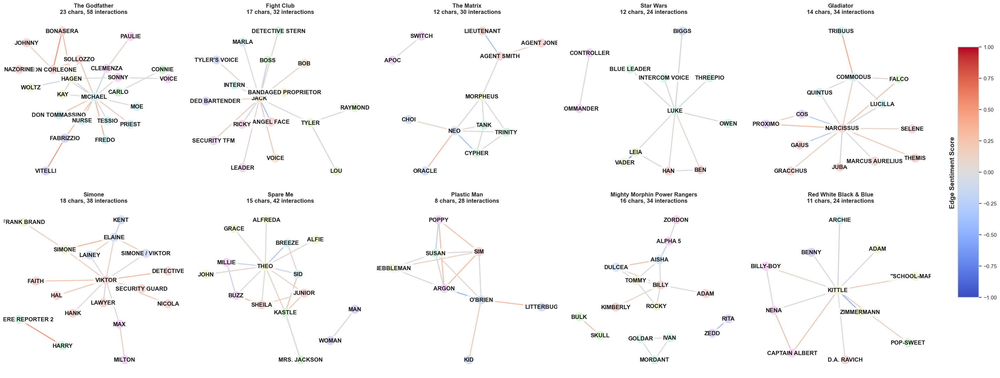

In [103]:
analyzer.plot_combined_interaction_networks(top_5_movie_ids, bottom_5_movie_ids, title=False)

4. **`plot_combined_sentiment_arcs(top_ids, bottom_ids)`**  
   Takes two lists of movie IDs (e.g., top 10 and bottom 10) and plots their cumulative sentiment arcs in a 2-row grid.  
   - The first row shows the top movies’ arcs, and the second row shows the bottom movies’ arcs.
   - Each arc is created by computing the cumulative average sentiment of lines across the movie.
   - Positive sentiment areas are shaded green; negative areas are shaded red.


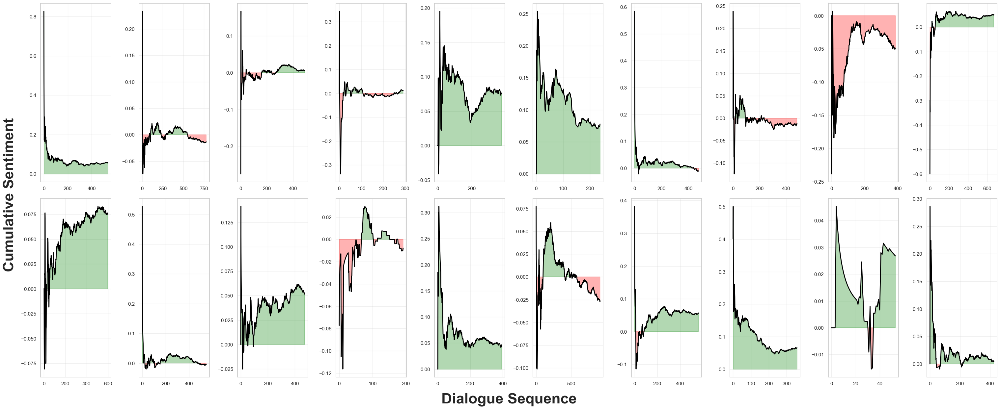

In [85]:
analyzer.plot_combined_sentiment_arcs(top_10_movie_ids, bottom_10_movie_ids)

5. **`plot_combined_emotional_keywords(top_ids, bottom_ids)`**  
   Identifies "emotional" keywords in the top and bottom sets of movies.  
   - Tokenizes each movie’s text, removes stopwords and punctuation.
   - Scores each word’s sentiment; selects words with notable sentiment (abs > 0.1).
   - Plots the top emotionally charged words (by frequency and sentiment magnitude) in a bar chart for each movie.

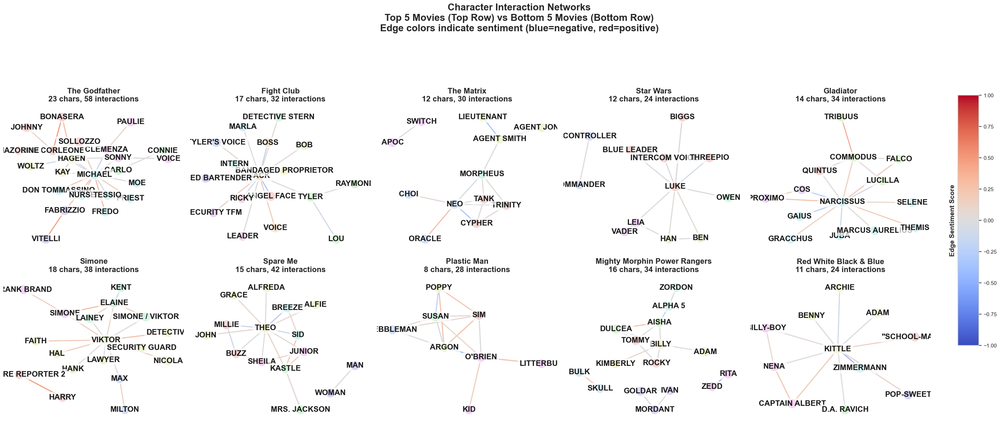

In [86]:
analyzer.plot_combined_interaction_networks(top_5_movie_ids, bottom_5_movie_ids, title=True)

5. **`plot_combined_emotional_keywords(top_ids, bottom_ids)`**  
   Identifies "emotional" keywords in the top and bottom sets of movies.  
   - Tokenizes each movie’s text, removes stopwords and punctuation.
   - Scores each word’s sentiment; selects words with notable sentiment (abs > 0.1).
   - Plots the top emotionally charged words (by frequency and sentiment magnitude) in a bar chart for each movie.

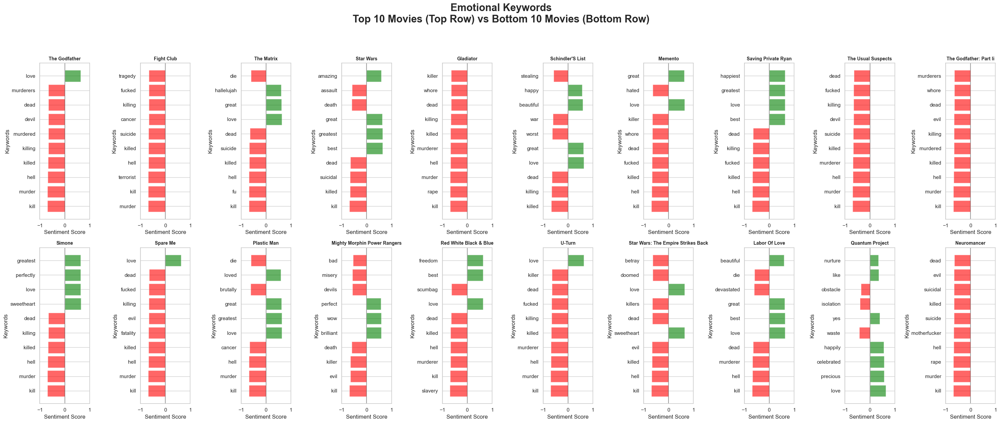

In [91]:
analyzer.plot_combined_emotional_keywords(top_10_movie_ids, bottom_10_movie_ids)

6. **`compute_advanced_network_metrics(movie_ids)`**  
   For a list of movie IDs, calculates a comprehensive set of network metrics:  
   - Basic metrics: number of nodes, edges, density, average degree.
   - Clustering coefficient, modularity (via Louvain), sentiment distribution of edges.
   - Path metrics (average shortest path, diameter), centralities (betweenness, closeness, eigenvector) in the largest connected component.
   - Degree assortativity.
   Returns these metrics in a DataFrame.

In [95]:
# Top/Bottom 100 for statistical analysis
top_100_movies = movie_titles.nlargest(100, 'Votes')
top_100_movie_ids = top_100_movies['MovieID'].tolist()

bottom_100_movies = movie_titles.nsmallest(100, 'Votes')
bottom_100_movie_ids = bottom_100_movies['MovieID'].tolist()

# Compute metrics for top 100 and bottom 100 movies
top_100_metrics_df = analyzer.compute_advanced_network_metrics(top_100_movie_ids)
bottom_100_metrics_df = analyzer.compute_advanced_network_metrics(bottom_100_movie_ids)

# Add "Group" column
top_100_metrics_df['Group'] = 'Top'
bottom_100_metrics_df['Group'] = 'Bottom'

# Combine into one DataFrame
combined_100_df = pd.concat([top_100_metrics_df, bottom_100_metrics_df], ignore_index=True)

# Save the DataFrame
combined_100_df.to_csv(r"Data\statistics\combined_100_df.csv", index=False)

# display DFs
print("Stats for Top 100 Movies:")
display(top_100_metrics_df)
print("Stats for Bottom 100 Movies:")
display(bottom_100_metrics_df)



Stats for Top 100 Movies:


,MovieID,Title,NumNodes,NumEdges,AvgDegree,Density,AvgClustering,Modularity,MeanEdgeSentiment,StdEdgeSentiment,SkewEdgeSentiment,KurtEdgeSentiment,AvgShortestPath,Diameter,AvgBetweenness,AvgCloseness,AvgEigenvector,Assortativity
0,m203,the godfather,23,58,5.043478,0.114625,0.186304,0.359096,0.051864,0.193242,-0.311217,0.579088,2.407115,4,0.067005,0.432069,0.164241,-0.475741
1,m348,fight club,17,32,3.764706,0.117647,0.000000,-0.035156,-0.025133,0.175814,-0.377471,-0.441152,2.073529,3,0.071569,0.498289,0.203606,-0.826463
2,m433,the matrix,12,30,5.000000,0.227273,0.291667,0.277778,-0.022971,0.135743,-0.653074,1.205301,2.155556,4,0.144444,0.487120,0.261211,-0.035354
3,m529,star wars,12,24,4.000000,0.181818,0.172619,0.253472,-0.019420,0.220051,-1.196451,3.149460,1.888889,3,0.111111,0.552072,0.280465,-0.571317
4,m76,gladiator,14,34,4.857143,0.186813,0.382900,0.174740,0.082674,0.180302,0.314374,0.352043,1.901099,3,0.075092,0.543326,0.233387,-0.711427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,m153,"o brother, where art thou?",15,25,3.333333,0.123810,0.136508,0.494083,0.037242,0.148231,1.594038,5.499807,1.916667,3,0.130952,0.545326,0.297328,-0.405063
96,m390,hotel rwanda,20,42,4.200000,0.110526,0.133918,-0.095238,0.023687,0.180624,-1.453547,3.298522,1.889474,2,0.049415,0.540731,0.190240,-0.868460
97,m594,vertigo,10,18,3.600000,0.200000,0.000000,-0.074074,0.028411,0.131127,-1.529699,2.981068,1.955556,3,0.119444,0.533750,0.279628,-0.834764
98,m249,as good as it gets,15,32,4.266667,0.152381,0.090370,0.388672,0.018741,0.177709,-0.881614,0.149602,2.219048,3,0.093773,0.467096,0.217864,-0.669303


Stats for Bottom 100 Movies:


,MovieID,Title,NumNodes,NumEdges,AvgDegree,Density,AvgClustering,Modularity,MeanEdgeSentiment,StdEdgeSentiment,SkewEdgeSentiment,KurtEdgeSentiment,AvgShortestPath,Diameter,AvgBetweenness,AvgCloseness,AvgEigenvector,Assortativity
0,m181,simone,18,38,4.222222,0.124183,0.148822,0.344875,0.077409,0.168324,-1.108261,4.446376,2.133333,4,0.080952,0.487517,0.209117,-0.567304
1,m527,spare me,15,42,5.600000,0.200000,0.380808,0.208617,0.045302,0.149746,0.390292,0.552751,1.820513,3,0.074592,0.568452,0.242428,-0.503704
2,m160,plastic man,8,28,7.000000,0.500000,0.550000,-0.038265,0.053766,0.184591,-0.629106,0.036551,1.642857,3,0.107143,0.640171,0.322165,-0.342466
3,m135,mighty morphin power rangers,16,34,4.250000,0.141667,0.402083,0.441176,-0.007486,0.151667,-0.465880,1.025574,2.000000,4,0.142857,0.527128,0.288292,0.058893
4,m488,red white black & blue,11,24,4.363636,0.218182,0.246465,-0.010417,0.016094,0.152524,-1.118319,2.108911,1.781818,2,0.086869,0.580323,0.268520,-0.822476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,m537,suburbia,12,46,7.666667,0.348485,0.452381,0.086957,0.051117,0.163093,-0.666377,0.579159,1.863636,4,0.086364,0.564238,0.250599,-0.350552
96,m210,the crow: salvation,11,22,4.000000,0.200000,0.000000,0.301653,-0.125606,0.189379,-0.825459,0.681840,2.181818,4,0.131313,0.478015,0.267446,-0.571429
97,m421,leviathan,10,34,6.800000,0.377778,0.605000,0.070934,-0.071164,0.140314,-0.618530,-0.445741,1.666667,3,0.083333,0.619821,0.288598,-0.553763
98,m573,trouble in paradise,13,30,4.615385,0.192308,0.260806,0.237778,0.088691,0.163640,0.288243,-0.601931,2.018182,4,0.113131,0.518422,0.263345,-0.454616


7. **`compute_cumulative_arcs(movie_ids, num_points=100)`**  
   Computes an averaged sentiment arc across multiple movies by normalizing each movie’s cumulative sentiment trajectory to a fixed length (`num_points`).  
   - Useful for comparing overall sentiment progression trends across different sets of movies.


In [96]:
arc = analyzer.compute_cumulative_arcs(top_10_movie_ids, num_points=100)
print(arc)


[ 0.05359     0.01108306 -0.01028548  0.02984072  0.01475417  0.01574719
  0.01047408  0.00532413  0.01937181  0.03078508  0.02828061  0.03712987
  0.03708335  0.03287518  0.02942237  0.02998781  0.03052022  0.02727753
  0.02365965  0.02100042  0.02199633  0.02715873  0.02978003  0.03123283
  0.03494118  0.03462762  0.03111334  0.03298531  0.03481925  0.03625554
  0.03386541  0.03733273  0.03699372  0.03792096  0.03676462  0.03494708
  0.03434293  0.03189596  0.03210034  0.03176824  0.03315424  0.031191
  0.0292329   0.02917879  0.0324732   0.02855795  0.02827679  0.02709541
  0.02675561  0.02632929  0.02434265  0.02501382  0.02507321  0.02600705
  0.02513379  0.02483889  0.0236981   0.02362935  0.0235227   0.0224697
  0.02255223  0.021556    0.02000408  0.01997384  0.02002587  0.02241589
  0.02230032  0.02355808  0.02211317  0.02211681  0.02122146  0.0210746
  0.02148014  0.02167492  0.02205281  0.02249537  0.02192113  0.02150011
  0.01999864  0.02137997  0.02183458  0.02263075  0.022

8. **`plot_average_arcs_top_bottom_20(top_20_ids, bottom_20_ids)`**  
   Uses `compute_cumulative_arcs` to produce average sentiment arcs for top 20 vs bottom 20 movies and plots them together on one graph.


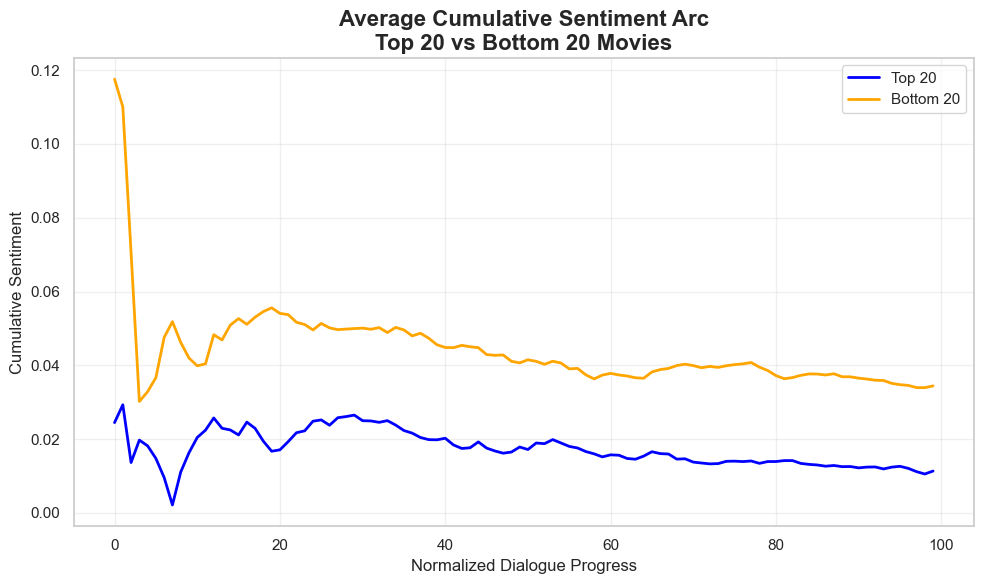

In [98]:
# Compute top/bottom 20 sets
top_20_movies = movie_titles.nlargest(20, 'Votes')
top_20_movie_ids = top_20_movies['MovieID'].tolist()

bottom_20_movies = movie_titles.nsmallest(20, 'Votes')
bottom_20_movie_ids = bottom_20_movies['MovieID'].tolist()

analyzer.plot_average_arcs_top_bottom_20(top_20_movie_ids, bottom_20_movie_ids)

9. **`plot_average_arcs_per_genre(num_points=100)`**  
   Categorizes movies by genre and computes an average sentiment arc for each genre.  
   - Plots all genre arcs on one figure, allowing easy comparison of how sentiment dynamics vary by genre.

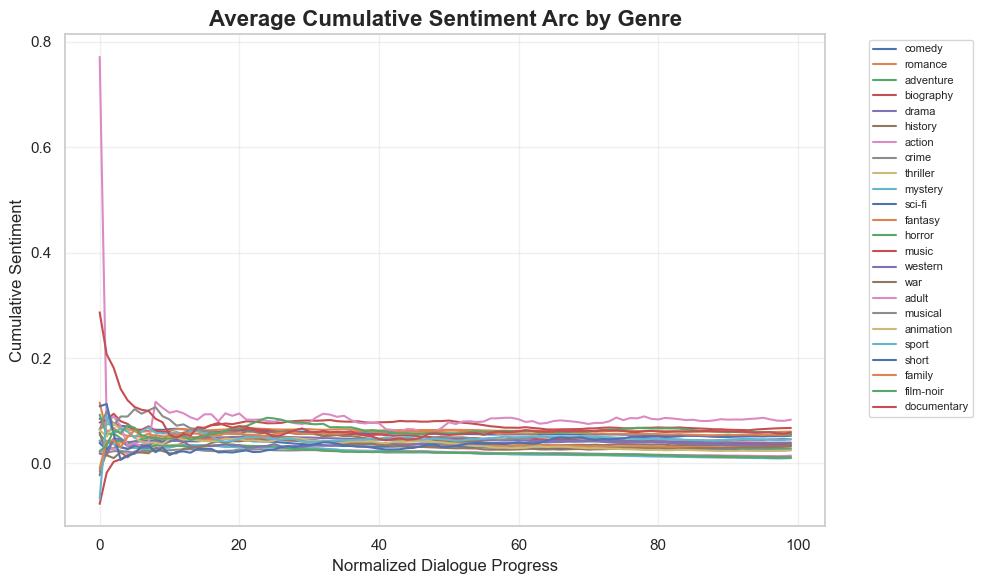

In [99]:
analyzer.plot_average_arcs_per_genre(num_points=100)

### **Statistical Analysis (Semantic Networks)**
**
In the previous parts, we constructed a comprehensive dataset of network metrics and sentiment-related features derived from our semantic networks using the `MovieDialogueAnalyzer`. This dataset—containing metrics like average degree, modularity, clustering, as well as sentiment-based edge features—serves as the foundation for the statistical tests and classification procedures that follow.

Having generated a DataFrame that splits movies into "Top" and "Bottom" groups (for instance, by votes or rating), we now proceed to more rigorous statistical testing. Here, we use non-parametric Mann-Whitney tests to identify which network-level metrics differ significantly between these two groups, while applying multiple comparison corrections to maintain statistical validity. Additionally, we will build a predictive model (logistic regression) to see if these network metrics can classify movies as "Top" vs. "Bottom." We further confirm the significance of our classifier’s performance with a permutation test.

**In other words:** The code below builds upon the DataFrame already created by the `MovieDialogueAnalyzer` class and its associated analyses. Now that we have a well-structured dataset, we apply a series of statistical procedures to rigorously test the differences and predictive power of the extracted metrics.


In [ ]:
import os
import pandas as pd
import numpy as np
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.utils import shuffle

# Create output directory for tables if it doesn't exist
os.makedirs("Tables", exist_ok=True)

combined_20_df = pd.read_csv(r"Data\statistics\combined_100_df.csv")

# ------------------------------------------------------------
# STEP 1: Mann-Whitney Tests with Multiple Comparison Correction
# ------------------------------------------------------------
metrics_to_test = [
    'NumNodes', 'NumEdges', 'AvgDegree', 'Density', 'AvgClustering', 'Modularity',
    'MeanEdgeSentiment', 'StdEdgeSentiment', 'SkewEdgeSentiment', 'KurtEdgeSentiment',
    'AvgShortestPath', 'Diameter', 'AvgBetweenness', 'AvgCloseness', 'AvgEigenvector',
    'Assortativity'
]

# Compute the mean of each metric for the top and bottom groups
group_means = combined_20_df.groupby('Group')[metrics_to_test].mean()

# Save group means to a LaTeX table
group_means_latex = group_means.T
group_means_latex.to_latex("Tables/means_by_group.tex", float_format="%.4f")

top_values_dict = {}
bottom_values_dict = {}
p_values = []

# Perform Mann-Whitney tests
for metric in metrics_to_test:
    top_values = combined_20_df.loc[combined_20_df['Group'] == 'Top', metric].dropna()
    bottom_values = combined_20_df.loc[combined_20_df['Group'] == 'Bottom', metric].dropna()
    if len(top_values) > 0 and len(bottom_values) > 0:
        stat, p_value = mannwhitneyu(top_values, bottom_values, alternative='two-sided')
        p_values.append(p_value)
    else:
        p_values.append(np.nan)

# Multiple comparison correction (Benjamini-Hochberg)
valid_indices = [i for i, v in enumerate(p_values) if not np.isnan(v)]
valid_p_values = [p_values[i] for i in valid_indices]

reject, p_adjusted, _, _ = multipletests(valid_p_values, method='fdr_bh')

# Prepare a DataFrame for Mann-Whitney test results
results_data = []
for i, metric in enumerate(metrics_to_test):
    if i in valid_indices:
        adj_idx = valid_indices.index(i)
        results_data.append({
            'Metric': metric,
            'Original p-value': p_values[i],
            'Adjusted p-value': p_adjusted[adj_idx],
            'Reject H0 (FDR)': reject[adj_idx]
        })
    else:
        # Missing values scenario
        results_data.append({
            'Metric': metric,
            'Original p-value': np.nan,
            'Adjusted p-value': np.nan,
            'Reject H0 (FDR)': np.nan
        })

mw_results_df = pd.DataFrame(results_data)
mw_results_df.set_index('Metric', inplace=True)

# Save Mann-Whitney results to a LaTeX table
mw_results_df.to_latex("Tables/mannwhitney_results.tex", float_format="%.4e")

# ------------------------------------------------------------
# STEP 2: Classification with Cross-Validation
# ------------------------------------------------------------
# Prepare features and target for classification
data = combined_20_df.dropna(subset=metrics_to_test)  # Drop rows with NaNs in metrics
X = data[metrics_to_test].values
y = (data['Group'] == 'Top').astype(int).values  # Top=1, Bottom=0

clf = LogisticRegression(max_iter=1000)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X, y, cv=cv, scoring='accuracy')

mean_acc = np.mean(scores)
std_acc = np.std(scores, ddof=1)

# Create a DataFrame for classification results
classification_results_df = pd.DataFrame({
    'Mean Accuracy': [mean_acc],
    'Std Accuracy': [std_acc]
})

# Save classification results to a LaTeX table
classification_results_df.to_latex("Tables/classification_accuracy.tex", float_format="%.4f", index=False)

# ------------------------------------------------------------
# STEP 3: Permutation Test for Classifier
# ------------------------------------------------------------
n_permutations = 1000
permutation_accuracies = []

for _ in range(n_permutations):
    y_perm = shuffle(y, random_state=None)
    perm_score = np.mean(cross_val_score(clf, X, y_perm, cv=cv, scoring='accuracy'))
    permutation_accuracies.append(perm_score)

permutation_accuracies = np.array(permutation_accuracies)
p_value_permutation = np.mean(permutation_accuracies >= mean_acc)

# Create a DataFrame for permutation test results
perm_test_results_df = pd.DataFrame({
    'Observed Accuracy': [mean_acc],
    'p-value (Permutation)': [p_value_permutation]
})

# Save permutation test results to a LaTeX table
perm_test_results_df.to_latex("Tables/permutation_results.tex", float_format="%.4f", index=False)

In [107]:
# Print summaries to console
print("\nMean values for each metric by group:")
display(group_means.T)

print("\nMann-Whitney Tests with Benjamini-Hochberg correction:")
display(mw_results_df)

print("\nClassification Accuracy (Logistic Regression):")
display(classification_results_df)

print("\nPermutation Test Results:")
display(perm_test_results_df)



Mean values for each metric by group:


Group,Bottom,Top
NumNodes,13.040000,15.880000
NumEdges,30.080000,34.530000
AvgDegree,4.604409,4.347922
Density,0.236454,0.176835
AvgClustering,0.240862,0.185440
Modularity,0.201555,0.266329
MeanEdgeSentiment,0.034837,0.024559
StdEdgeSentiment,0.156094,0.164334
SkewEdgeSentiment,-0.066126,-0.054815
KurtEdgeSentiment,0.799651,1.078703



Mann-Whitney Tests with Benjamini-Hochberg correction:


,Original p-value,Adjusted p-value,Reject H0 (FDR)
Metric,,,
NumNodes,0.000415,0.003320,True
NumEdges,0.044796,0.089593,False
AvgDegree,0.078337,0.117593,False
Density,0.000069,0.001104,True
AvgClustering,0.027611,0.063111,False
Modularity,0.008623,0.022995,True
MeanEdgeSentiment,0.266775,0.328338,False
StdEdgeSentiment,0.080845,0.117593,False
SkewEdgeSentiment,0.952265,0.952265,False



Classification Accuracy (Logistic Regression):


,Mean Accuracy,Std Accuracy
0,0.603077,0.118785



Permutation Test Results:


,Observed Accuracy,p-value (Permutation)
0,0.603077,0.007


### **Semantic Arc Clustering**

Having analyzed various network structures and their associated sentimental patterns, we now turn to a more nuanced perspective: **clustering movies based on their sentiment arcs.** Our previous steps gave us tools to extract sentiment arcs from movie dialogue lines, compute similarities between these arcs, and then construct networks from these similarities.

In this stage, we leverage these sentiment-based representations of movies to identify clusters using the Louvain community detection algorithm. By treating movies as nodes and their pairwise sentiment arc similarities as edges, we form a graph on which we can run clustering. This allows us to reveal groups of movies that share common sentiment trajectories over their dialogues, potentially corresponding to similar storytelling patterns or thematic structures.

After identifying clusters, we also annotate these clusters with information about their most frequent genres and highlight representative movies. This approach integrates semantic (textual), sentiment (emotional), and structural (network) analysis into a single framework, offering a richer understanding of the cinematic landscape.

**In other words:** The code below uses sentiment arcs (computed from the lines of each movie) to create a similarity network of movies. It then applies Louvain clustering to identify communities of movies with similar sentiment arcs. Finally, it visualizes these clusters, annotating each with its top genres and highlighting representative films.


In [134]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from community import community_louvain
from sklearn.metrics.pairwise import cosine_similarity
# from semantic_clustering import load_movie_data, MovieDialogueAnalyzer
import pandas as pd
from matplotlib.lines import Line2D
import math
import ast
from matplotlib import font_manager

def prepare_sentiment_data(movie_ids, movie_lines, sia):
    """Prepare sentiment arcs as a feature matrix for clustering.
    
    For each movie:
    - Extract line-by-line sentiments using `sia`.
    - Compute a cumulative average sentiment arc.
    - Interpolate the arc to a fixed length (100 points) for uniform comparison.
    
    Returns:
    - A numpy array (movies x 100) of sentiment arcs.
    """
    sentiment_data = []
    for movie_id in movie_ids:
        movie_lines_filtered = movie_lines[movie_lines['MovieID'] == movie_id].sort_values('LineID')
        movie_lines_filtered['Sentiment'] = movie_lines_filtered['Text'].apply(
            lambda x: sia.polarity_scores(x)['compound']
        )
        movie_lines_filtered['CumulativeAverage'] = movie_lines_filtered['Sentiment'].expanding().mean()
        x_original = np.linspace(0, 1, len(movie_lines_filtered))
        y_original = movie_lines_filtered['CumulativeAverage'].values
        f_interp = interp1d(x_original, y_original, kind='linear', fill_value="extrapolate")
        x_resampled = np.linspace(0, 1, 100)
        y_resampled = f_interp(x_resampled)
        sentiment_data.append(y_resampled)
    return np.array(sentiment_data)

def create_similarity_graph(sentiment_data):
    """Create a graph where each node is a movie, and edges represent cosine similarity of their sentiment arcs.
    
    - Compute the cosine similarity between every pair of sentiment arcs.
    - Add an edge if similarity > 0.5 (a chosen threshold).
    
    Returns:
    - A NetworkX Graph object representing the similarity network.
    """
    similarity_matrix = cosine_similarity(sentiment_data)
    graph = nx.Graph()
    for i in range(len(similarity_matrix)):
        graph.add_node(i)
    for i in range(len(similarity_matrix)):
        for j in range(i + 1, len(similarity_matrix)):
            similarity = similarity_matrix[i, j]
            if similarity > 0.5:
                graph.add_edge(i, j, weight=similarity)
    return graph

def cluster_with_louvain(graph):
    """Cluster movies using the Louvain algorithm on the similarity graph.
    
    Returns:
    - partition: A dictionary mapping each node (movie) to a cluster ID.
    """
    partition = community_louvain.best_partition(graph, weight='weight', resolution=1.0)
    return partition

def get_genre_frequencies(partition, movie_ids, movie_titles):
    """Calculate genre frequencies for each cluster.
    
    For each cluster identified by partition:
    - Extract the genres of the movies in that cluster.
    - Count how often each genre appears.
    
    Returns:
    - genre_frequencies: dict of cluster_id -> {genre: count}
    """
    genre_frequencies = {}
    movie_titles = movie_titles.set_index('MovieID')
    for movie_idx, cluster_id in partition.items():
        movie_id = movie_ids[movie_idx]
        genres = movie_titles.loc[movie_id, 'Genres'].split('|')
        if cluster_id not in genre_frequencies:
            genre_frequencies[cluster_id] = {}
        for genre in genres:
            genre_frequencies[cluster_id][genre] = genre_frequencies[cluster_id].get(genre, 0) + 1
    return genre_frequencies

def plot_clusters_louvain(sentiment_data, partition, movie_ids, movie_titles, genre_frequencies, enable_title=True):
    """Visualize sentiment arcs for each Louvain cluster with genre annotations and top movies.
    
    Parameters
    ----------
    sentiment_data : np.ndarray
        The array of sentiment arcs for each movie (movies x 100).
    partition : dict
        A dictionary from node index to cluster ID.
    movie_ids : list
        The list of movie IDs corresponding to each sentiment_data row.
    movie_titles : pd.DataFrame
        DataFrame containing MovieID, Title, Votes, Genres.
    genre_frequencies : dict
        A dictionary with cluster_id as keys and genre frequency dictionaries as values.
    enable_title : bool
        Whether to display the main figure title.
    """
    # Group movies by clusters
    clusters = {}
    for movie_idx, cluster_id in partition.items():
        clusters.setdefault(cluster_id, []).append(movie_idx)
    
    movie_titles_indexed = movie_titles[movie_titles['MovieID'].isin(movie_ids)].copy()
    n_clusters = len(clusters)
    n_cols = 1
    n_rows = math.ceil(n_clusters / n_cols)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 7 * n_rows))
    if n_clusters == 1:
        axes = [axes]
    
    cluster_title_fontsize = 28
    legend_fontsize = 24
    title_fontsize = 28
    legend_font_prop = font_manager.FontProperties(size=legend_fontsize, weight='bold')
    
    for cluster_idx, (cluster_id, movies) in enumerate(clusters.items()):
        ax = axes[cluster_idx]
        cluster_movies = [movie_ids[movie_idx] for movie_idx in movies]
        
        # Plot all arcs in the cluster as a background
        for m_i, movie_idx in enumerate(movies):
            ax.plot(np.linspace(0, 1, 100), sentiment_data[movie_idx], alpha=0.3,
                    label='Individual Movies' if m_i == 0 else "")
        
        # Highlight top 5 movies by Votes
        movie_data = movie_titles_indexed[movie_titles_indexed['MovieID'].isin(cluster_movies)]
        top_movies = movie_data.nlargest(5, 'Votes')
        
        for _, movie_row in top_movies.iterrows():
            movie_id = movie_row['MovieID']
            idx = movie_ids.index(movie_id)
            ax.plot(np.linspace(0, 1, 100), sentiment_data[idx], linewidth=2,
                    label=f"Top Movie: {movie_row['Title']}")
        
        # Compute top genres
        genres = genre_frequencies[cluster_id]
        sorted_genres = sorted(genres.items(), key=lambda x: x[1], reverse=True)
        
        bullet_points = []
        for genre_str, count in sorted_genres[:3]:
            try:
                parsed_genres = ast.literal_eval(genre_str)
                pretty_genres = ", ".join(parsed_genres)
            except:
                pretty_genres = genre_str.strip("[]' ")
            
            bullet_points.append(f"• {pretty_genres} ({count})")
        
        top_genres_label = "Top Genres:\n" + "\n".join(bullet_points)
        
        # Set title and grid
        ax.set_title(f"Cluster {cluster_idx + 1} (Movies: {len(movies)})", 
                     fontsize=cluster_title_fontsize, fontweight='bold')
        ax.grid(True, alpha=0.3)
        
        # Modify legend
        handles, labels = ax.get_legend_handles_labels()
        
        # Add a dummy handle for top genres
        top_genres_handle = Line2D([], [], color='none')
        handles.append(top_genres_handle)
        labels.append(top_genres_label)
        
        if len(handles) > 0:
            ax.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.,
                      prop=legend_font_prop)
        
        # Remove x and y labels (use global labels)
        ax.set_xlabel("")
        ax.set_ylabel("")
    
    # Remove extra axes if any
    for k in range(cluster_idx + 1, len(axes)):
        axes[k].axis('off')
    
    # Main figure title if enabled
    if enable_title:
        plt.suptitle("Sentiment Clustering of Movies Using Louvain Algorithm", 
                     fontsize=title_fontsize, y=1.02, fontweight='bold')
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    
    # Global x and y labels
    fig.text(0.25, 0.02, "Dialogue Sequence", ha='center', va='center', fontsize=28, fontweight='bold')
    fig.text(-0.002, 0.5, "Cumulative Sentiment", ha='center', va='center', rotation='vertical', fontsize=28, fontweight='bold')
    
    plt.show()
    # plt.savefig('Figures/sentiment_clusters_louvain_annotated.png', dpi=500, bbox_inches='tight')
    # plt.close()

The following code will do the following using the class we defined above:

- **Loading movie dialog data:** The process begins by extracting the raw dialogue lines, conversations, and titles that form the foundation of our dataset. This initial step ensures we have all necessary textual and structural information ready for sentiment computation and subsequent clustering.

- **Filtering and selecting movies:**  After ensuring the 'Votes' field is numeric, we focus on those movies that have valid vote counts. This filtering step narrows our analysis to a clean, consistent subset, ensuring that sentiment arcs and clustering are performed on well-documented films.

- **Preparing sentiment arcs:** For each selected movie, we compute a sentiment arc representing its cumulative emotional trajectory across the dialogue. The arcs are normalized and resampled to a fixed length, allowing for meaningful comparisons between different movies’ sentiment progressions.

- **Creating a similarity graph:**  Once all sentiment arcs are ready, we measure how closely these arcs resemble one another. We construct a similarity graph where each movie is a node, and edges connect movies whose sentiment trajectories share a strong affinity. This graph is the structural basis for detecting communities of similarly emotive narratives.

- **Clustering with the Louvain algorithm:** Applying the Louvain algorithm to the similarity graph identifies clusters of movies that exhibit similar sentiment dynamics. This community detection helps reveal underlying groupings of films that follow comparable emotional patterns throughout their dialogues.



In [112]:
# We begin by loading the raw dialogue data and titles to form our foundational dataset.
print("Loading movie dialog data...")
movie_lines, movie_conversations, movie_titles = load_movie_data()
analyzer = MovieDialogueAnalyzer(movie_lines, movie_conversations, movie_titles)

# Next, we prepare a subset of movies, ensuring that the 'Votes' column is numeric and filtering out any missing values.
movie_titles['Votes'] = pd.to_numeric(movie_titles['Votes'], errors='coerce')
all_movies = movie_titles.dropna(subset=['Votes'])
movie_ids = all_movies['MovieID'].tolist()

# Using the filtered set of movies, we compute their sentiment arcs. 
# These arcs represent the cumulative average sentiment over each movie’s dialogue.
print("Preparing sentiment arcs...")
sentiment_data = prepare_sentiment_data(movie_ids, movie_lines, analyzer.sia)

# With sentiment arcs ready, we construct a similarity graph where edges link movies with similar sentiment trajectories.
print("Creating similarity graph...")
similarity_graph = create_similarity_graph(sentiment_data)

Loading movie dialog data...
Loading movie dialog dataset...
Processing conversations...
Loaded 304713 lines from 617 movies
Found 83079 valid conversations
Preparing sentiment arcs...
Creating similarity graph...


Applying the Louvain algorithm to the similarity graph clusters the movies into communities based on their sentiment arc similarity.

In [115]:
print("Clustering with Louvain algorithm...")
partition = cluster_with_louvain(similarity_graph)

print(f"Number of clusters: {len(set(partition.values()))}")

Clustering with Louvain algorithm...
Number of clusters: 4


Once clusters are defined, we analyze the distribution of genres within each cluster to understand their thematic composition.

In [119]:
print("Calculating genre frequencies...")
genre_frequencies = get_genre_frequencies(partition, movie_ids, movie_titles)

Calculating genre frequencies...


Finally, we visualize the clusters, plotting their sentiment arcs, highlighting top movies, and annotating dominant genres

Visualizing clusters...


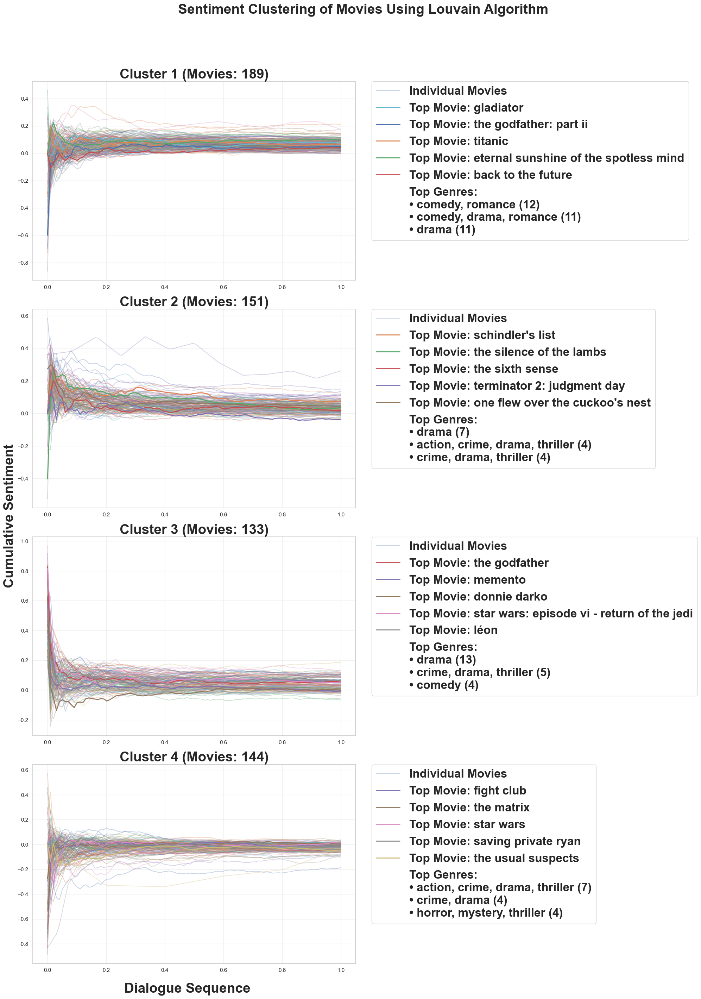

In [135]:
print("Visualizing clusters...")
plot_clusters_louvain(sentiment_data, partition, movie_ids, movie_titles, genre_frequencies, enable_title=True)

This script constructs a bipartite network focusing on the top 20 actors (by number of movies) and their associated films. It then projects this network onto the actors alone, identifies communities among them, and visualizes the resulting structure—highlighting key collaborators and grouping actors into meaningful clusters.

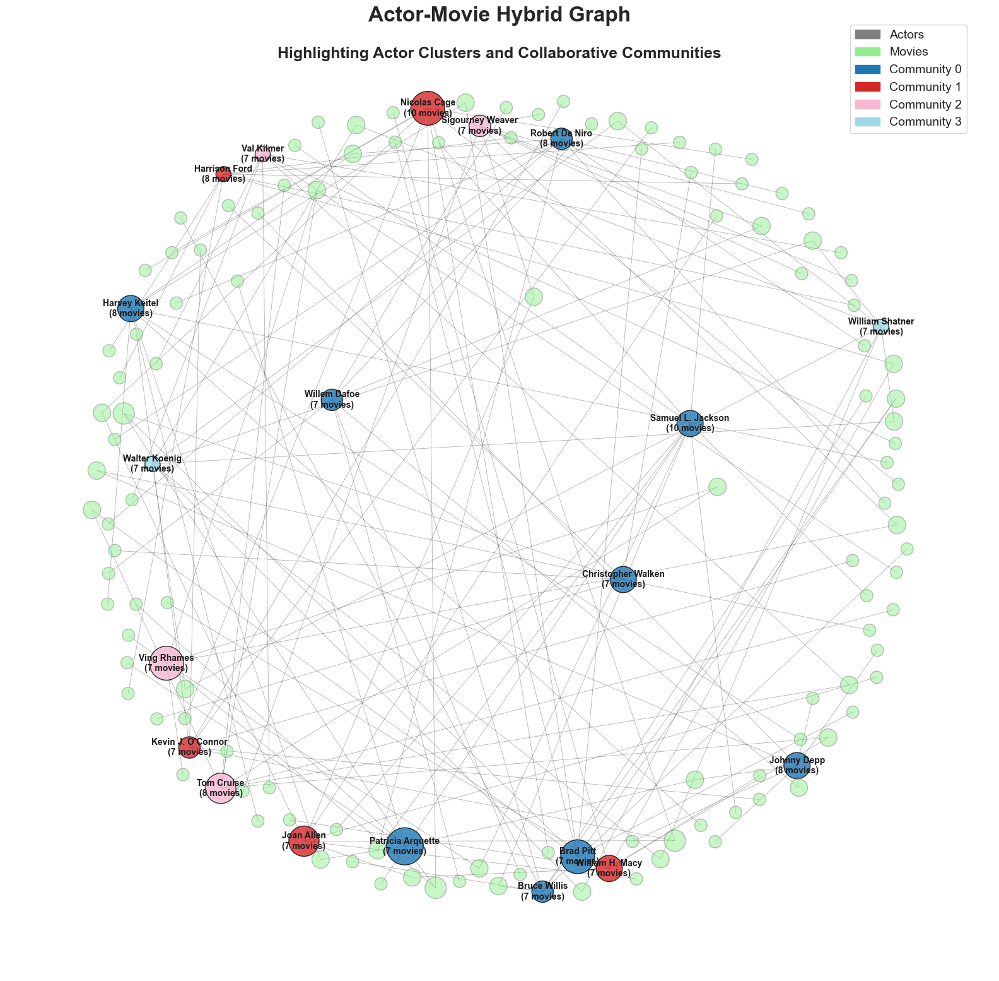

In [139]:
def plot_actor_movie_hybrid(cast_df, top_n=20):
    # Ensure directories exist
    os.makedirs('Figures', exist_ok=True)
    os.makedirs('Tables', exist_ok=True)

    # Get top actors by number of movies
    actor_counts = cast_df['actor_name'].value_counts().head(top_n)
    top_actors = actor_counts.index.tolist()

    # Create a bipartite graph: Actors - Movies
    B = nx.Graph()
    # Filter data to relevant actors
    relevant_data = cast_df[cast_df['actor_name'].isin(top_actors)]
    
    # Add actor nodes
    B.add_nodes_from(top_actors, bipartite=0, node_type='actor')
    
    # Add movie nodes and edges from actors to movies
    for _, row in relevant_data.iterrows():
        actor = row['actor_name']
        movie = row['movie_title']
        if not B.has_node(movie):
            B.add_node(movie, bipartite=1, node_type='movie')
        B.add_edge(actor, movie)

    # Project the bipartite graph onto actors only (to find actor-actor collaborations)
    # The actor projection creates edges between actors who share at least one movie.
    # Use a built-in projection method from networkx:
    top_actors_nodes = [n for n, d in B.nodes(data=True) if d['node_type'] == 'actor']
    A = nx.bipartite.projected_graph(B, top_actors_nodes)
    
    # Calculate shared movies (weight of edges)
    for u, v in A.edges():
        # Count how many movies these two actors share
        shared = len(set(B[u]) & set(B[v]))
        A[u][v]['weight'] = shared

    # Identify communities of actors within A
    from networkx.algorithms.community import greedy_modularity_communities
    communities = greedy_modularity_communities(A, weight='weight')
    
    # Assign community IDs to each actor
    actor_community_map = {}
    for i, comm in enumerate(communities):
        for actor in comm:
            actor_community_map[actor] = i

    # Now we visualize the hybrid graph B (Actors + Movies), but color actors by their community.
    plt.figure(figsize=(16, 16))
    pos = nx.spring_layout(B, k=2, iterations=50, seed=42)

    actor_nodes = [n for n, d in B.nodes(data=True) if d['node_type'] == 'actor']
    movie_nodes = [n for n, d in B.nodes(data=True) if d['node_type'] == 'movie']

    # Calculate degrees for sizing
    movie_degrees = {}
    for m in movie_nodes:
        movie_degrees[m] = B.degree(m)

    actor_sizes = [A.degree(a)*300 for a in actor_nodes]  # size by actor-actor degree in A
    movie_sizes = [movie_degrees[m]*200 for m in movie_nodes]

    # Color actors by community
    # Generate a color map for communities:
    num_communities = len(communities)
    cmap = plt.cm.get_cmap('tab20', num_communities)
    actor_colors = [cmap(actor_community_map[a]) for a in actor_nodes]

    # Draw the nodes
    nx.draw_networkx_nodes(B, pos, nodelist=actor_nodes,
                           node_color=actor_colors,
                           node_size=actor_sizes,
                           alpha=0.8, edgecolors='black')
    
    nx.draw_networkx_nodes(B, pos, nodelist=movie_nodes,
                           node_color='lightgreen',
                           node_size=movie_sizes,
                           alpha=0.5, edgecolors='gray')
    
    # Draw edges
    nx.draw_networkx_edges(B, pos, alpha=0.4, width=0.5)

    # Labels
    actor_labels = {node: f"{node}\n({actor_counts[node]} movies)" for node in actor_nodes if node in actor_counts}
    # For readability, limit labeling to the top few actors by degree or centrality, or omit movie labels entirely
    nx.draw_networkx_labels(B, pos, actor_labels, font_size=10, font_weight='bold')

    # Legend for node types
    actor_patch = mpatches.Patch(color='gray', label='Actors')
    movie_patch = mpatches.Patch(color='lightgreen', label='Movies')

    # Create a legend for communities by showing a few community colors
    community_handles = []
    for i in range(min(num_communities, 5)):
        community_handles.append(mpatches.Patch(color=cmap(i), label=f'Community {i}'))

    plt.suptitle("Actor-Movie Hybrid Graph", fontsize=24, y=0.97, fontweight='bold')
    plt.title("Highlighting Actor Clusters and Collaborative Communities", fontsize=18, y=0.94, pad=20, fontweight='bold')

    plt.legend(handles=[actor_patch, movie_patch] + community_handles,
               fontsize=14, loc='upper right', bbox_to_anchor=(0.98, 1))

    plt.axis('off')
    plt.tight_layout()
    # plt.savefig("Figures/actor_movie_communities.png", dpi=300, bbox_inches='tight')
    # plt.close()
    plt.show()

    # Exporting community data to a table
    community_data = []
    for i, comm in enumerate(communities):
        for actor in comm:
            community_data.append({'CommunityID': i, 'Actor': actor, 'MoviesCount': actor_counts.get(actor, 0)})

    community_df = pd.DataFrame(community_data).sort_values(['CommunityID', 'MoviesCount'], ascending=[True, False])
    community_df_latex = community_df.to_latex(index=False, float_format="%.0f")
    with open("Tables/actor_communities.tex", "w") as f:
        f.write(community_df_latex)


if __name__ == "__main__":
    # Load the dataset
    file_path = r"Data/movie_casts_sample.csv"
    cast_df = pd.read_csv(file_path)
    plot_actor_movie_hybrid(cast_df, top_n=20)


### Using the Cornell Movie Dataset we tried to explore various insights about Genres ###
The main objectives that we achieved using the data for genres are:

- **Top Genres based on IMDB ranking and voting**
- **Sentiment analysis for the genres**
- **Dialogue complexity for the genres**
- **Artist distribution for the genres**




**Top Genres by Voting and IMDB Ranking**
1. Parse and organize movie metadata from `movie_titles_metadata.txt`
2. We will calculate and compare aggregate statistics for genres (total votes, average ratings, and a combined 3. popularity score).
4. Visualize the results to highlight top genres for IMDB Rating and Total votes

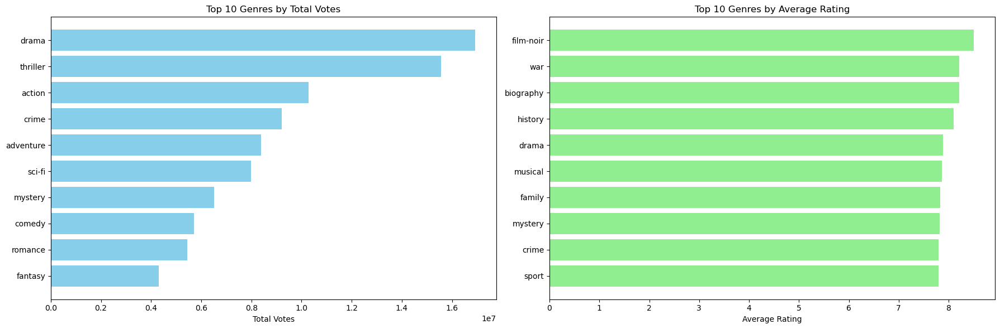

In [1]:
import pandas as pd
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
import ast

# File paths (loaded once)
movie_lines_file = r"D:\archive\movie_lines.txt"
movie_metadata_file = r"D:\archive\movie_titles_metadata.txt"

# Step 1: Parse movie_titles_metadata.txt (Load metadata once)
movie_data = []

try:
    with open(movie_metadata_file, 'r', encoding="ISO-8859-1") as f:
        for line in f:
            parts = line.strip().split(' +++$+++ ')
            if len(parts) >= 6:  # Ensure there are at least 6 parts (ID, title, year, rating, votes, genres)
                movie_id = parts[0]
                title = parts[1]
                
                # Extract the numeric year (in case of additional information like '/I')
                year_str = parts[2]
                year = int(''.join(filter(str.isdigit, year_str)))  # Extract only digits
                
                rating = float(parts[3])
                votes = int(parts[4])
                genres = ast.literal_eval(parts[5])  # Convert string to list
                
                movie_data.append([movie_id, title, year, rating, votes, genres])

    # Create a DataFrame for metadata
    df = pd.DataFrame(movie_data, columns=['Movie ID', 'Title', 'Year', 'Rating', 'Votes', 'Genres'])

except OSError as e:
    print(f"Error opening file: {e}")
except ValueError as e:
    print(f"Error parsing line: {line} | {e}")

# Step 2: Extract dialogues from movie_lines.txt
movie_dialogues = defaultdict(list)

# Step 1: Parse movie_titles_metadata.txt 
movie_data = []

try:
    with open(movie_metadata_file, 'r', encoding="ISO-8859-1") as f:
        for line in f:
            parts = line.strip().split(' +++$+++ ')
            if len(parts) >= 6:  # Ensure there are at least 6 parts (ID, title, year, rating, votes, genres)
                movie_id = parts[0]
                title = parts[1]
                
                # Extract the numeric year (in case of additional information like '/I')
                year_str = parts[2]
                year = int(''.join(filter(str.isdigit, year_str)))  # Extract only digits
                
                rating = float(parts[3])
                votes = int(parts[4])
                genres = ast.literal_eval(parts[5])  # Convert string to list
                
                movie_data.append([movie_id, title, year, rating, votes, genres])

    # Create a DataFrame for metadata
    df = pd.DataFrame(movie_data, columns=['Movie ID', 'Title', 'Year', 'Rating', 'Votes', 'Genres'])

except OSError as e:
    print(f"Error opening file: {e}")
except ValueError as e:
    print(f"Error parsing line: {line} | {e}")

# Step 2: Aggregate votes and average ratings by genre
genre_votes = defaultdict(int)
genre_ratings = defaultdict(float)
genre_count = defaultdict(int)

for _, row in df.iterrows():
    votes = row['Votes']
    rating = row['Rating']
    genres = row['Genres']
    
    for genre in genres:
        genre_votes[genre] += votes
        genre_ratings[genre] += rating * votes  # Weighted rating (rating * votes)
        genre_count[genre] += 1

# Step 3: Calculate average ratings and aggregate total votes
average_ratings = {genre: genre_ratings[genre] / genre_votes[genre] if genre_votes[genre] > 0 else 0 
                   for genre in genre_ratings}

# Step 4: Sort genres based on total votes and average rating
sorted_by_votes = {genre: genre_votes[genre] for genre in sorted(genre_votes, key=genre_votes.get, reverse=True)}
sorted_by_rating = {genre: average_ratings[genre] for genre in sorted(average_ratings, key=average_ratings.get, reverse=True)}

# Step 5: Create a combined popularity score
popularity_score = {genre: genre_votes[genre] * average_ratings[genre] for genre in genre_votes}

# Sort genres by popularity score
sorted_by_popularity_score = {genre: popularity_score[genre] for genre in sorted(popularity_score, key=popularity_score.get, reverse=True)}

# Step 6: Visualize the top genres by total votes and average rating
top_genres_by_votes = list(sorted_by_votes.items())[:10]
top_genres_by_rating = list(sorted_by_rating.items())[:10]
top_genres_by_popularity = list(sorted_by_popularity_score.items())[:10]

# Plotting Total Votes and Average Ratings
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Total Votes
axes[0].barh([item[0] for item in top_genres_by_votes], [item[1] for item in top_genres_by_votes], color='skyblue')
axes[0].set_title('Top 10 Genres by Total Votes')
axes[0].set_xlabel('Total Votes')
axes[0].invert_yaxis()

# Average Ratings
axes[1].barh([item[0] for item in top_genres_by_rating], [item[1] for item in top_genres_by_rating], color='lightgreen')
axes[1].set_title('Top 10 Genres by Average Rating')
axes[1].set_xlabel('Average Rating')
axes[1].invert_yaxis()

plt.tight_layout()
plt.show()


**Community exploration througout the Genres**

Next, we construct a genre-based movie network:

Data Source: `movie_titles_metadata.txt` provides movie IDs, titles, years, ratings, votes, and genres.
- Network Nodes: Each node represents a movie.
- Network Edges: Edges connect movies sharing at least one genre.
- We will also apply the Louvain community detection method with a higher resolution to identify finer-grained clusters of movies based on their genre relationships.

Number of communities detected: 283
Number of nodes (movies): 616
Number of edges (shared genres): 112603

Community sizes:
Community 0: 84 nodes
Community 25: 75 nodes
Community 3: 62 nodes
Community 136: 58 nodes
Community 276: 39 nodes
Community 104: 7 nodes
Community 4: 2 nodes
Community 8: 2 nodes
Community 21: 2 nodes
Community 24: 2 nodes
Community 32: 2 nodes
Community 35: 2 nodes
Community 37: 2 nodes
Community 45: 2 nodes
Community 56: 2 nodes
Community 60: 2 nodes
Community 69: 2 nodes
Community 71: 2 nodes
Community 95: 2 nodes
Community 105: 2 nodes
Community 1: 1 nodes
Community 2: 1 nodes
Community 5: 1 nodes
Community 6: 1 nodes
Community 7: 1 nodes
Community 9: 1 nodes
Community 10: 1 nodes
Community 11: 1 nodes
Community 12: 1 nodes
Community 13: 1 nodes
Community 14: 1 nodes
Community 15: 1 nodes
Community 16: 1 nodes
Community 17: 1 nodes
Community 18: 1 nodes
Community 19: 1 nodes
Community 20: 1 nodes
Community 22: 1 nodes
Community 23: 1 nodes
Community 26: 1 nod

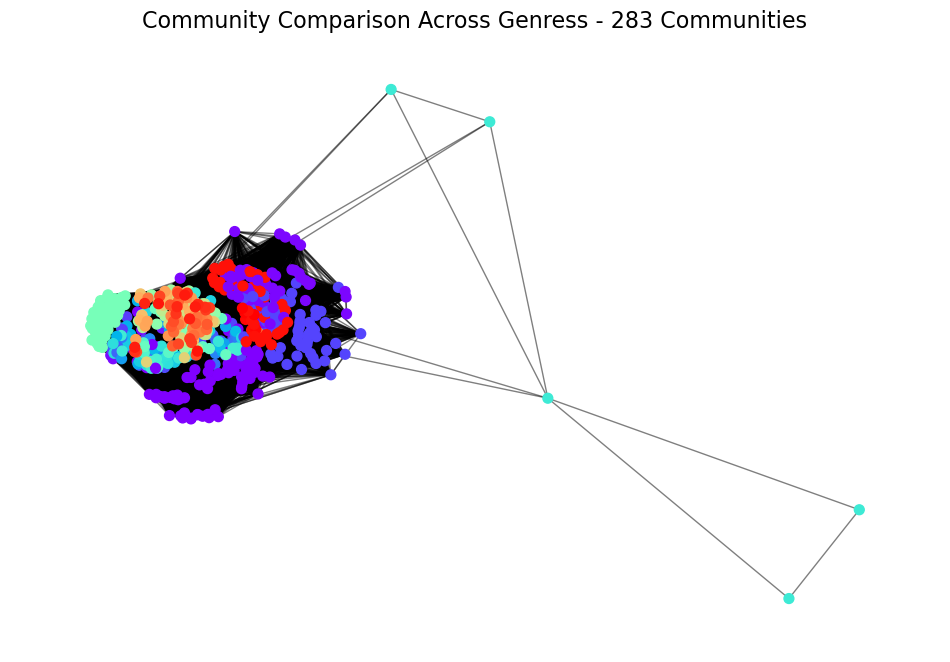

In [2]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
import ast
from collections import defaultdict
from community import community_louvain  # Louvain method for community detection

# Step 1: Parse movie_titles_metadata.txt to get movie data
movie_data = []

try:
    with open(movie_metadata_file, 'r', encoding="ISO-8859-1") as f:
        for line in f:
            parts = line.strip().split(' +++$+++ ')
            if len(parts) >= 6:  # Ensure there are at least 6 parts (ID, title, year, rating, votes, genres)
                movie_id = parts[0]
                title = parts[1]
                
                # Extract the numeric year (in case of additional information like '/I')
                year_str = parts[2]
                year = int(''.join(filter(str.isdigit, year_str)))  # Extract only digits
                
                rating = float(parts[3])
                votes = int(parts[4])
                genres = ast.literal_eval(parts[5])  # Convert string to list
                
                movie_data.append([movie_id, title, year, rating, votes, genres])

    # Create a DataFrame for metadata
    df = pd.DataFrame(movie_data, columns=['Movie ID', 'Title', 'Year', 'Rating', 'Votes', 'Genres'])

except OSError as e:
    print(f"Error opening file: {e}")
except ValueError as e:
    print(f"Error parsing line: {line} | {e}")

# Step 2: Create a graph of movies and genres (nodes are movies, edges are shared genres)
G = nx.Graph()

# Add nodes and edges based on shared genres
for _, row in df.iterrows():
    movie_id = row['Movie ID']
    genres = row['Genres']
    for genre in genres:
        G.add_node(movie_id, genre=genre)  # Add movie node with genre as attribute
        for other_row in df.iterrows():
            other_movie_id = other_row[1]['Movie ID']
            other_genres = other_row[1]['Genres']
            if movie_id != other_movie_id and any(genre in other_genres for genre in genres):
                G.add_edge(movie_id, other_movie_id)

# Step 3: Run community detection using Louvain method with increased resolution
partition = community_louvain.best_partition(G, resolution=2.0)  # Increased resolution

# Step 4: Collect community information
num_communities = len(set(partition.values()))
community_sizes = defaultdict(int)
for community_id in partition.values():
    community_sizes[community_id] += 1

sample_nodes = defaultdict(list)
for movie_id, community_id in partition.items():
    sample_nodes[community_id].append(movie_id)

# Step 5: Print additional information
print(f"Number of communities detected: {num_communities}")
print(f"Number of nodes (movies): {len(G.nodes)}")
print(f"Number of edges (shared genres): {len(G.edges)}")

print("\nCommunity sizes:")
for community_id, size in sorted(community_sizes.items(), key=lambda x: x[1], reverse=True):
    print(f"Community {community_id}: {size} nodes")
    
# Step 6: Visualize the community comparison across genres using Force Atlas layout in Matplotlib
# Apply spring layout for force-directed graph visualization with fixed random seed
pos = nx.spring_layout(G, k=0.15, iterations=20, seed=42)  # Fixed seed for reproducibility

# Color the nodes based on their community
community_colors = [partition[node] for node in G.nodes]

# Plot the network with community coloring
plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(G, pos, node_size=50, cmap=plt.cm.rainbow, node_color=community_colors)
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title(f"Community Comparison Across Genress - {num_communities} Communities", fontsize=16)
plt.axis('off')
plt.show()


**Dialogue Complexity Over the years**

From the movie dialogues, get the words and sentence to find the average sentence length

In [3]:
import re

def calculate_complexity(dialogue):
    # Split the dialogue into sentences based on punctuation marks (.!?)
    sentences = re.split(r'[.!?]', dialogue)
    
    # Calculate sentence lengths (number of words in each sentence)
    sentence_lengths = [len(re.findall(r'\w+', sentence)) for sentence in sentences]
    
    # Total word count is the sum of the sentence lengths
    total_words = sum(sentence_lengths)
    
    # Vocabulary diversity is the ratio of unique words to total words
    unique_words = len(set(re.findall(r'\w+', dialogue.lower())))
    vocab_diversity = unique_words / total_words if total_words > 0 else 0
    
    # Average sentence length is the mean of the sentence lengths
    avg_sentence_length = sum(sentence_lengths) / len(sentence_lengths) if sentence_lengths else 0
    
    return avg_sentence_length, vocab_diversity, total_words


**Processing Steps**
1. Extracted `Movie ID` and cleaned the `Year` field by removing any non-numeric characters.
2. Handled invalid or missing year data by setting it to `None`.

**Output**
- Created a **DataFrame** with the following columns:
  - `Movie ID`
  - `Year`


In [4]:
# Load movie metadata (Movie ID and Year)
movie_metadata_file = r"D:\archive\movie_titles_metadata.txt"
movie_metadata = []

try:
    with open(movie_metadata_file, 'r', encoding="ISO-8859-1") as f:
        for line in f:
            parts = line.strip().split(' +++$+++ ')
            if len(parts) >= 6:  # Movie ID, Title, Year, Rating, Votes, Genres
                movie_id = parts[0]
                # Clean the Year field (remove anything after the numeric part)
                year_str = parts[2]
                year = ''.join(filter(str.isdigit, year_str))  # Keep only digits from year string
                if year:  # Ensure we have a valid year
                    year = int(year)
                else:
                    year = None  # If no valid year, set it to None
                movie_metadata.append([movie_id, year])

    # Create a DataFrame for movie metadata
    movie_df = pd.DataFrame(movie_metadata, columns=['Movie ID', 'Year'])

except OSError as e:
    print(f"Error opening file: {e}")
except ValueError as e:
    print(f"Error parsing line: {line} | {e}")


In [5]:
dialogue_data = []
movie_lines_file = r"D:\archive\movie_lines.txt"

try:
    with open(movie_lines_file, 'r', encoding="ISO-8859-1") as f:
        for line in f:
            parts = line.strip().split(' +++$+++ ')
            if len(parts) == 5:  # Movie ID, Character, Dialogue
                line_id = parts[0]  # This is the line ID
                character = parts[1]
                dialogue = parts[4]
                movie_id = parts[2]  # Extract the Movie ID
                dialogue_data.append([line_id, movie_id, character, dialogue])

    # Create a DataFrame for dialogue data
    dialogue_df = pd.DataFrame(dialogue_data, columns=['Line ID', 'Movie ID', 'Character', 'Dialogue'])

except OSError as e:
    print(f"Error opening file: {e}")
except ValueError as e:
    print(f"Error parsing line: {line} | {e}")


**Merged the movie data with its dialogues**

In [6]:
# Merge movie metadata with dialogues based on Movie ID
movie_dialogue_df = pd.merge(dialogue_df, movie_df, on='Movie ID')


**Based on the dialogue for each individual movies, calculated the metrics for its dialogues**

In [7]:
from collections import defaultdict

# Calculate complexity metrics for each movie
movie_complexity = defaultdict(list)

for _, row in movie_dialogue_df.iterrows():
    movie_id = row['Movie ID']
    dialogue = row['Dialogue']
    avg_sentence_length, vocab_diversity, total_words = calculate_complexity(dialogue)
    
    # Store complexity metrics for each movie
    movie_complexity[movie_id].append([avg_sentence_length, vocab_diversity, total_words])


In [8]:
# Aggregate the complexity metrics by movie
movie_complexity_df = pd.DataFrame({
    'Movie ID': list(movie_complexity.keys()),
    'Avg Sentence Length': [sum([x[0] for x in movie_complexity[movie_id]]) / len(movie_complexity[movie_id]) for movie_id in movie_complexity],
    'Vocab Diversity': [sum([x[1] for x in movie_complexity[movie_id]]) / len(movie_complexity[movie_id]) for movie_id in movie_complexity],
    'Total Word Count': [sum([x[2] for x in movie_complexity[movie_id]]) for movie_id in movie_complexity]
})


In [9]:
# Merge with movie metadata to get years
movie_complexity_df = pd.merge(movie_complexity_df, movie_df, on='Movie ID')


In [10]:
# Group by year and calculate the average complexity metrics for each year
yearly_complexity_df = movie_complexity_df.groupby('Year').agg({
    'Avg Sentence Length': 'mean',
    'Vocab Diversity': 'mean',
    'Total Word Count': 'mean'
}).reset_index()

# Show the result
print(yearly_complexity_df)


    Year  Avg Sentence Length  Vocab Diversity  Total Word Count
0   1927             3.230252         0.904779       1041.000000
1   1931             3.698530         0.940095       6347.500000
2   1932             3.407457         0.945361       5013.000000
3   1933             4.707527         0.935210       4835.500000
4   1934             3.911821         0.949242       8970.666667
..   ...                  ...              ...               ...
69  2006             3.596296         0.950712       4070.500000
70  2007             3.396730         0.958496       4188.400000
71  2008             4.449147         0.948226       4789.000000
72  2009             3.259263         0.950878       5148.750000
73  2010             3.942571         0.935312       8110.000000

[74 rows x 4 columns]


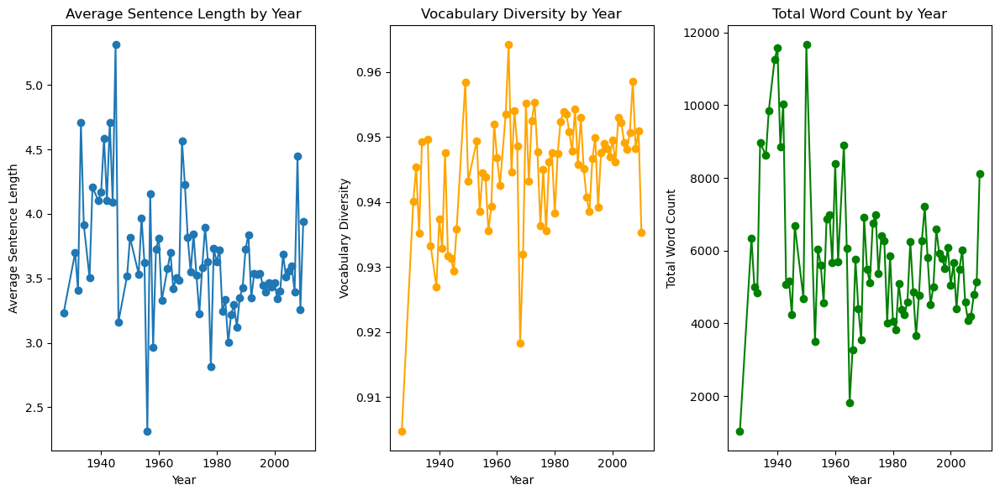

In [11]:
import matplotlib.pyplot as plt

# Plotting the complexity metrics over the years
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.plot(yearly_complexity_df['Year'], yearly_complexity_df['Avg Sentence Length'], marker='o')
plt.title('Average Sentence Length by Year')
plt.xlabel('Year')
plt.ylabel('Average Sentence Length')

plt.subplot(1, 3, 2)
plt.plot(yearly_complexity_df['Year'], yearly_complexity_df['Vocab Diversity'], marker='o', color='orange')
plt.title('Vocabulary Diversity by Year')
plt.xlabel('Year')
plt.ylabel('Vocabulary Diversity')

plt.subplot(1, 3, 3)
plt.plot(yearly_complexity_df['Year'], yearly_complexity_df['Total Word Count'], marker='o', color='green')
plt.title('Total Word Count by Year')
plt.xlabel('Year')
plt.ylabel('Total Word Count')

plt.tight_layout()
plt.show()


**Followed the same process as above but this time we calculated the metrics for each genre of the movies**

In [12]:
import pandas as pd
import re
import ast
from collections import defaultdict

# Function to calculate complexity metrics for a dialogue
def calculate_complexity(dialogue):
    # Split the dialogue into sentences based on punctuation marks (.!?)
    sentences = re.split(r'[.!?]', dialogue)
    
    # Calculate sentence lengths (number of words in each sentence)
    sentence_lengths = [len(re.findall(r'\w+', sentence)) for sentence in sentences]
    
    # Total word count is the sum of the sentence lengths
    total_words = sum(sentence_lengths)
    
    # Vocabulary diversity is the ratio of unique words to total words
    unique_words = len(set(re.findall(r'\w+', dialogue.lower())))
    vocab_diversity = unique_words / total_words if total_words > 0 else 0
    
    # Average sentence length is the mean of the sentence lengths
    avg_sentence_length = sum(sentence_lengths) / len(sentence_lengths) if sentence_lengths else 0
    
    return avg_sentence_length, vocab_diversity, total_words

# Load movie metadata (Movie ID and Year)
movie_metadata_file = r"D:\archive\movie_titles_metadata.txt"
movie_metadata = []

try:
    with open(movie_metadata_file, 'r', encoding="ISO-8859-1") as f:
        for line in f:
            parts = line.strip().split(' +++$+++ ')
            if len(parts) >= 6:  # Movie ID, Title, Year, Rating, Votes, Genres
                movie_id = parts[0]
                # Clean the Year field (remove anything after the numeric part)
                year_str = parts[2]
                year = ''.join(filter(str.isdigit, year_str))  # Keep only digits from year string
                year = int(year) if year else None
                genres = ast.literal_eval(parts[5])  # Convert genres to list
                movie_metadata.append([movie_id, year, genres])

    # Create a DataFrame for movie metadata
    movie_df = pd.DataFrame(movie_metadata, columns=['Movie ID', 'Year', 'Genres'])

except OSError as e:
    print(f"Error opening file: {e}")
except ValueError as e:
    print(f"Error parsing line: {line} | {e}")

# Load movie dialogue
dialogue_data = []
movie_lines_file = r"D:\archive\movie_lines.txt"

try:
    with open(movie_lines_file, 'r', encoding="ISO-8859-1") as f:
        for line in f:
            parts = line.strip().split(' +++$+++ ')
            if len(parts) == 5:  # Movie ID, Character, Dialogue
                line_id = parts[0]  # This is the line ID
                character = parts[1]
                dialogue = parts[4]
                movie_id = parts[2]  # Extract the Movie ID
                dialogue_data.append([line_id, movie_id, character, dialogue])

    # Create a DataFrame for dialogue data
    dialogue_df = pd.DataFrame(dialogue_data, columns=['Line ID', 'Movie ID', 'Character', 'Dialogue'])

except OSError as e:
    print(f"Error opening file: {e}")
except ValueError as e:
    print(f"Error parsing line: {line} | {e}")

# Merge movie metadata with dialogues based on Movie ID
movie_dialogue_df = pd.merge(dialogue_df, movie_df, on='Movie ID')

# Filter for movies with exactly one genre
one_genre_df = movie_dialogue_df[movie_dialogue_df['Genres'].apply(lambda x: len(x) == 1)]

# Calculate complexity metrics for each movie (filtered by one genre)
movie_complexity = defaultdict(list)

for _, row in one_genre_df.iterrows():
    movie_id = row['Movie ID']
    dialogue = row['Dialogue']
    avg_sentence_length, vocab_diversity, total_words = calculate_complexity(dialogue)
    genre = row['Genres'][0]  # Since there's only one genre, we can access it directly
    
    # Store complexity metrics for each genre
    movie_complexity[genre].append([avg_sentence_length, vocab_diversity, total_words])

# Aggregate the complexity metrics by genre
genre_complexity_df = pd.DataFrame({
    'Genre': list(movie_complexity.keys()),
    'Avg Sentence Length': [sum([x[0] for x in movie_complexity[genre]]) / len(movie_complexity[genre]) for genre in movie_complexity],
    'Vocab Diversity': [sum([x[1] for x in movie_complexity[genre]]) / len(movie_complexity[genre]) for genre in movie_complexity],
    'Total Word Count': [sum([x[2] for x in movie_complexity[genre]]) for genre in movie_complexity]
})

# Calculate the average complexity metrics by dividing the sum by the number of movies in that genre
genre_complexity_df['Avg Sentence Length'] = genre_complexity_df['Avg Sentence Length'] / genre_complexity_df['Genre'].apply(lambda genre: len(movie_complexity[genre]))
genre_complexity_df['Vocab Diversity'] = genre_complexity_df['Vocab Diversity'] / genre_complexity_df['Genre'].apply(lambda genre: len(movie_complexity[genre]))
genre_complexity_df['Total Word Count'] = genre_complexity_df['Total Word Count'] / genre_complexity_df['Genre'].apply(lambda genre: len(movie_complexity[genre]))

# Show the result
print(genre_complexity_df)

         Genre  Avg Sentence Length  Vocab Diversity  Total Word Count
0        drama             0.000177         0.000045         12.461141
1       horror             0.001213         0.000369         10.043040
2     thriller             0.000702         0.000200         10.693779
3       comedy             0.000547         0.000145         10.683280
4        short             0.010332         0.003266          7.918919
5  documentary             0.003475         0.000969          9.621951
6       action             0.010913         0.002890         12.830303
7       sci-fi             0.010073         0.003448         10.075812
8      fantasy             0.032159         0.009165          8.504762


In [13]:
from collections import defaultdict


# File paths
movie_lines_file = r"D:\archive\movie_lines.txt"
movie_metadata_file = r"D:\archive\movie_titles_metadata.txt"

# Step 1: Load movie lines (extract artists per movie)
lines_data = []

# Reading the movie_lines.txt file
try:
    with open(movie_lines_file, 'r', encoding="ISO-8859-1") as f:
        for line in f:
            parts = line.strip().split(' +++$+++ ')
            if len(parts) == 5:
                line_id = parts[0]  # Line ID
                movie_id = parts[2]  # Movie ID
                character = parts[3]  # Character name
                lines_data.append([line_id, movie_id, character])

    # Create a DataFrame from the movie lines data
    lines_df = pd.DataFrame(lines_data, columns=['Line ID', 'Movie ID', 'Character'])

except OSError as e:
    print(f"Error opening file: {e}")

# Count distinct characters (artists) per movie
artist_count_per_movie = lines_df.groupby('Movie ID')['Character'].nunique().reset_index()
artist_count_per_movie = artist_count_per_movie.rename(columns={'Character': 'Artist Count'})

# Step 2: Load Movie Metadata to get genres
movie_metadata = []

try:
    with open(movie_metadata_file, 'r', encoding="ISO-8859-1") as f:
        for line in f:
            parts = line.strip().split(' +++$+++ ')
            if len(parts) >= 6:
                movie_id = parts[0]  # Movie ID
                genres = eval(parts[5])  # List of genres
                movie_metadata.append([movie_id, genres])

    # Create DataFrame for movie metadata (genres)
    movie_metadata_df = pd.DataFrame(movie_metadata, columns=['Movie ID', 'Genres'])

except OSError as e:
    print(f"Error opening file: {e}")

# Step 3: Merge the artist count with movie genres
merged_data = pd.merge(artist_count_per_movie, movie_metadata_df, on='Movie ID', how='left')

# Step 4: Calculate the average artist count per genre
genre_artist_count = defaultdict(lambda: {'total_artists': 0, 'movie_count': 0})

# Iterate through each movie and its genres
for _, row in merged_data.iterrows():
    genres = row['Genres']  # List of genres
    artist_count = row['Artist Count']  # Number of artists for this movie
    
    # For each genre, add the artist count to the total and increment movie count for the genre
    for genre in genres:
        genre_artist_count[genre]['total_artists'] += artist_count
        genre_artist_count[genre]['movie_count'] += 1

# Step 5: Calculate average artists per genre
avg_artists_per_genre = []
for genre, data in genre_artist_count.items():
    avg_artists = data['total_artists'] / data['movie_count']
    avg_artists_per_genre.append([genre, avg_artists])

# Convert to DataFrame for easier plotting
genre_data = pd.DataFrame(avg_artists_per_genre, columns=['Genre', 'Average Artist Count'])

# Sort by average artist count (optional, for better visualization)
genre_data = genre_data.sort_values(by='Average Artist Count', ascending=False)

- First found unique genres of the movie
- From the movie conversation data, extracted artist for each movie from their movie_ID
- After counting artist numbers for each movie, compared it to the genre they belong
- And finally plotted the genre-wise artist distribution

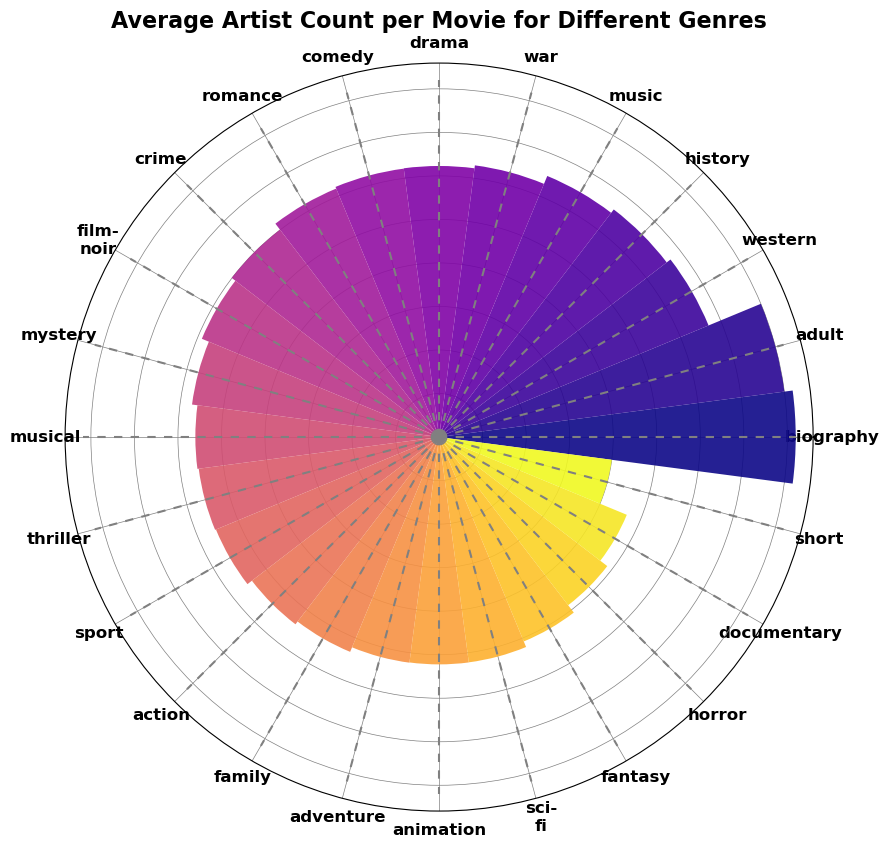

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from textwrap import wrap
import matplotlib.cm as cm

# Assuming genre_data is already created as per the previous code
# The data should have two columns: 'Genre' and 'Average Artist Count'

# Get the necessary values from genre_data
genres = genre_data['Genre'].values
avg_artist_counts = genre_data['Average Artist Count'].values

# Number of genres
num_genres = len(genres)

# Step 1: Initialize layout in polar coordinates
fig, ax = plt.subplots(figsize=(9, 12.6), subplot_kw={"projection": "polar"})

# Set background color to white, both axis and figure.
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

# Step 2: Set parameters for polar plot
# Angle for each genre in radians (equal spacing)
angles = np.linspace(0, 2 * np.pi, num_genres, endpoint=False).tolist()

# The bars will be the radial distance from the center
radii = avg_artist_counts

# Bar width
width = 2 * np.pi / num_genres

# Step 3: Generate a smooth gradient of colors using a colormap (e.g., 'Plasma')
colors = cm.plasma(np.linspace(0, 1, num_genres))  # You can change 'plasma' to other colormaps

# Step 4: Add bars to represent the average artist count for each genre with gradient colors
bars = ax.bar(angles, radii, color=colors, alpha=0.9, width=width, zorder=10)

# Step 5: Add dashed vertical lines to reference angles (like a radar chart)
ax.vlines(angles, 0, max(radii), color='grey', ls=(0, (4, 4)), zorder=11)

# Step 6: Add labels for the regions (genres)
# Wrap the genre names for better display
wrapped_genres = ["\n".join(wrap(r, 5, break_long_words=False)) for r in genres]

# Set the labels at the right angle (using the angles computed above)
ax.set_xticks(angles)
ax.set_xticklabels(wrapped_genres, size=12, fontweight='bold', color='black')

# Step 7: Add title and other visual elements
ax.set_title("Average Artist Count per Movie for Different Genres", size=16, fontweight='bold', color='black')

# Step 8: Remove the radial labels (optional) and adjust the radius of the plot
ax.set_yticklabels([])  # Remove radial labels

# Adjust the radius (y-limit) so the bars are spread across the plot
ax.set_ylim(0, max(radii) + 1)  # Extend the y-limit for visual clarity

# Step 9: Add gridlines (optional, can be useful for readability)
ax.grid(True, color='grey', linestyle='-', linewidth=0.5)

# Show the plot
plt.tight_layout()
plt.show()


In [15]:
pip install nltk

Note: you may need to restart the kernel to use updated packages.


**Sentiment Analysis**

1. **Load Sentiment Data:**
   - Read `Data_Set_S1.txt` and create a dictionary (`sentiment_dict`) with words and their happiness averages.

2. **Load Movie Metadata:**
   - Read `movie_titles_metadata.txt` to extract `Movie ID` and associated genres into a DataFrame.

3. **Load Movie Lines:**
   - Parse `movie_lines.txt` to create a dictionary (`movie_lines`) with `Movie ID` and dialogue text.

4. **Tokenization and Cleaning:**
   - Define a function `tokenize_and_clean` to tokenize dialogue, remove stopwords, and punctuation.

5. **Calculate Sentiment Score:**
   - For each movie's dialogue, tokenize and calculate the average sentiment score based on the sentiment dictionary.

6. **Distribute Sentiment Scores to Genres:**
   - Match movie sentiments with their genres and store in a list.

7. **Create DataFrame for Genre Sentiments:**
   - Convert the list into a DataFrame (`genre_sentiment_df`).

8. **Plot Sentiment by Genre:**
   - Use `seaborn` to create a boxplot showing sentiment distribution across genres.


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Jahidul\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Jahidul\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


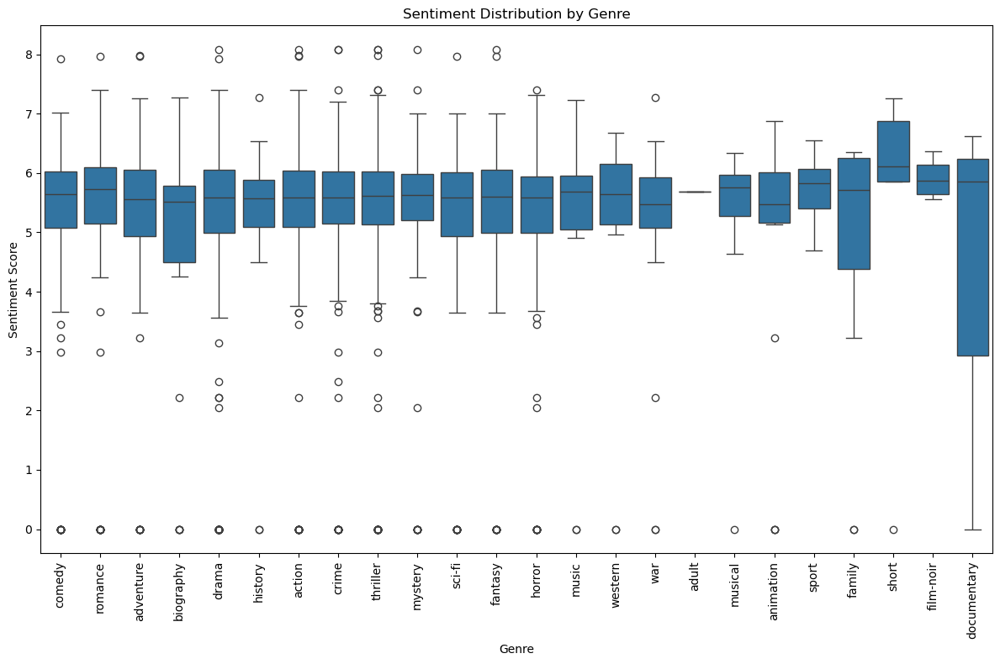

In [16]:
import nltk
import pandas as pd
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string

# Download necessary NLTK data files
nltk.download('punkt')
nltk.download('stopwords')

# Step 1: Load Sentiment Data (labMIT-1.0.txt)
sentiment_dict = {}

# File path to sentiment data
sentiment_file = 'D:/archive/Data_Set_S1.txt'

with open(sentiment_file, 'r', encoding="ISO-8859-1") as f:
    header = True  # Flag to skip the header line
    for line in f:
        # Skip the header line
        if header:
            header = False
            continue
        
        parts = line.strip().split("\t")
        if len(parts) >= 3:  # Skip invalid lines
            try:
                word = parts[0].lower()  # Convert word to lowercase
                happiness_avg = float(parts[2])  # Happiness average is in the 3rd column
                sentiment_dict[word] = happiness_avg
            except ValueError:
                # Skip lines where happiness_avg is not a valid float
                continue


# Step 2: Load Movie Metadata to get genres
movie_metadata = []
movie_metadata_file = 'D:/archive/movie_titles_metadata.txt'

try:
    with open(movie_metadata_file, 'r', encoding="ISO-8859-1") as f:
        for line in f:
            parts = line.strip().split(' +++$+++ ')
            if len(parts) >= 6:
                movie_id = parts[0]  # Movie ID
                genres = eval(parts[5])  # List of genres
                movie_metadata.append([movie_id, genres])

    # Create DataFrame for movie metadata (genres)
    movie_metadata_df = pd.DataFrame(movie_metadata, columns=['Movie ID', 'Genres'])

except Exception as e:
    print(f"Error reading movie metadata file: {e}")

# Step 3: Load Movie Lines (movie_lines.txt)
movie_lines = {}

movie_lines_file = 'D:/archive/movie_lines.txt'

try:
    with open(movie_lines_file, 'r', encoding="ISO-8859-1") as f:
        for line in f:
            parts = line.strip().split(' +++$+++ ')
            if len(parts) >= 5:
                line_id = parts[0]  # Line ID
                movie_id = parts[2]  # Movie ID
                character = parts[3]  # Character (not used here)
                dialogue = parts[4]  # Dialogue text
                movie_lines[line_id] = {"movie_id": movie_id, "dialogue": dialogue}
except Exception as e:
    print(f"Error reading movie lines file: {e}")

# Step 4: Tokenization and Cleaning Function
def tokenize_and_clean(text):
    # Tokenize the text into words
    tokens = word_tokenize(text.lower())  # Convert text to lowercase for consistency
    
    # Remove stopwords and punctuation
    stop_words = set(stopwords.words("english"))
    cleaned_tokens = [token for token in tokens if token not in stop_words and token not in string.punctuation]
    
    return cleaned_tokens

# Step 5: Calculate Sentiment Score for each movie's dialogues
movie_sentiments = {}

for line_id, line_data in movie_lines.items():
    movie_id = line_data["movie_id"]
    dialogue = line_data["dialogue"]
    
    # Tokenize and clean the dialogue
    cleaned_tokens = tokenize_and_clean(dialogue)
    
    # Calculate sentiment score
    sentiment_score = 0
    word_count = 0
    for token in cleaned_tokens:
        if token in sentiment_dict:
            sentiment_score += sentiment_dict[token]
            word_count += 1
    
    if word_count > 0:
        sentiment_score /= word_count  # Average sentiment score for the dialogue
    
    # Store the sentiment score for each movie
    if movie_id not in movie_sentiments:
        movie_sentiments[movie_id] = {"average_sentiment": sentiment_score}
    else:
        movie_sentiments[movie_id]["average_sentiment"] = sentiment_score

# Step 6: Distribute Sentiment Scores to Genres
genre_sentiments = []

for movie_id, sentiment_data in movie_sentiments.items():
    sentiment_score = sentiment_data["average_sentiment"]
    
    # Get the genres for the movie
    genres = movie_metadata_df[movie_metadata_df['Movie ID'] == movie_id]['Genres'].values
    if len(genres) > 0:
        for genre in genres[0]:  # Each movie can have multiple genres
            genre_sentiments.append({"genre": genre, "sentiment": sentiment_score})

# Step 7: Create a DataFrame for Genre Sentiments
genre_sentiment_df = pd.DataFrame(genre_sentiments)

# Step 8: Plot Sentiment Scores by Genre (Boxplot)
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.boxplot(x='genre', y='sentiment', data=genre_sentiment_df)
plt.xticks(rotation=90)
plt.xlabel('Genre')
plt.ylabel('Sentiment Score')
plt.title('Sentiment Distribution by Genre')
plt.tight_layout()
plt.show()



Now, we again analyzed for three unique genre movies to get a more specific pattern wise difference for the movies. 

1. **Load Data:**
   - Use `load_data_with_encoding` to load movie metadata, movie lines, movie conversations, and sentiment data with proper encoding handling.
   
2. **Filter Single-Genre Movies:**
   - Extract movies with exactly one genre from the `movie_metadata` DataFrame.

3. **Select Movies by Genre:**
   - For each of the selected genres (comedy, horror, action), find at least one movie from the single-genre movie list.

4. **Process Sentiment Data:**
   - Convert the sentiment data into a dictionary (`sentiment_scores`) mapping words to their happiness scores.

5. **Extract and Analyze Sentiment:**
   - For each selected movie, find related conversations and compute sentiment scores by averaging sentiment scores of words in each dialogue.

6. **Smooth Sentiment Data:**
   - Apply a moving average to smooth the sentiment data for clearer visualization.

7. **Plot Sentiment Analysis:**
   - Create a subplot for each genre (comedy, horror, action) displaying the smoothed sentiment scores over time, with a shared Y-axis for comparison.


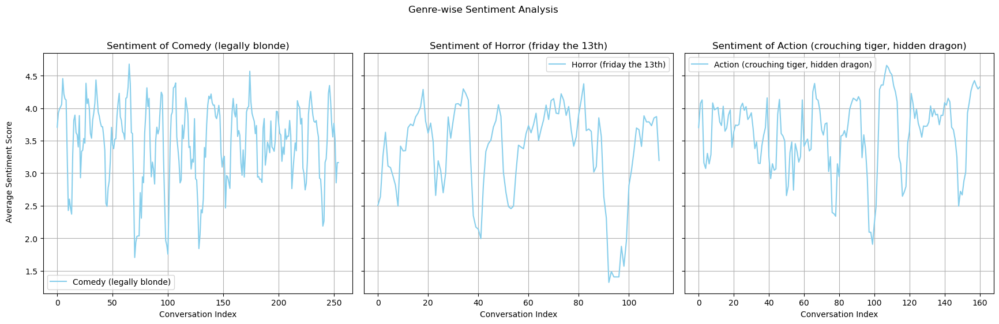

In [17]:
import ast  # To safely evaluate lists from strings
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Function to load data with encoding fallback
def load_data_with_encoding(file_path, sep, names=None, skiprows=None):
    try:
        return pd.read_csv(file_path, sep=sep, names=names, skiprows=skiprows, engine="python", encoding="utf-8")
    except UnicodeDecodeError:
        return pd.read_csv(file_path, sep=sep, names=names, skiprows=skiprows, engine="python", encoding="ISO-8859-1")

# Load movie metadata
movie_metadata_file = r'D:\archive\movie_titles_metadata.txt'
movie_metadata = load_data_with_encoding(
    movie_metadata_file, sep=r" \+\+\+\$\+\+\+ ",
    names=["movie_id", "title", "year", "rating", "votes", "genres"]
)

# Filter movies with exactly one genre
single_genre_movies = movie_metadata[movie_metadata["genres"].apply(lambda x: len(ast.literal_eval(x)) == 1)]

# Load movie lines and conversations
movie_lines_file = r'D:\archive\movie_lines.txt'
movie_conversations_file = r'D:\archive\movie_conversations.txt'

movie_lines = load_data_with_encoding(
    movie_lines_file, sep=r" \+\+\+\$\+\+\+ ",
    names=["line_id", "user_id", "movie_id", "character", "dialogue"]
)

movie_conversations = load_data_with_encoding(
    movie_conversations_file, sep=r" \+\+\+\$\+\+\+ ",
    names=["user_1", "user_2", "movie_id", "line_ids"]
)

# Load sentiment data
sentiment_file = r'D:\archive\Data_Set_S1.txt'
sentiment_data = load_data_with_encoding(
    sentiment_file, sep="\t", skiprows=2
)

# Process sentiment data into a dictionary
sentiment_scores = sentiment_data.set_index("word")["happiness_average"].to_dict()

# Select movies for specific genres (comedy, horror, action)
selected_genres = ["comedy", "horror", "action"]
selected_movies = {}

# Find at least one movie for each genre from single-genre movies
for genre in selected_genres:
    genre_movies = single_genre_movies[single_genre_movies["genres"].apply(lambda x: genre in ast.literal_eval(x))]
    
    # Select the first movie for the genre if available
    if not genre_movies.empty:
        selected_movie = genre_movies.iloc[0]  # Select one movie from the genre
        selected_movies[genre] = selected_movie["movie_id"]

# Extract conversations and analyze sentiments
genre_sentiments = {}
genre_movie_titles = {}  # Dictionary to store movie titles for each genre

for genre, movie_id in selected_movies.items():
    # Filter conversations for the selected movie
    movie_convs = movie_conversations[movie_conversations["movie_id"] == movie_id]
    
    # Initialize list to store sentiment scores for this genre
    sentiments = []
    
    for line_ids in movie_convs["line_ids"]:
        # Convert string representation of list to actual list
        line_ids_list = ast.literal_eval(line_ids)
        
        for line_id in line_ids_list:
            # Get the dialogue for the line_id
            dialogue_row = movie_lines[movie_lines["line_id"] == line_id]
            if not dialogue_row.empty:
                dialogue = dialogue_row.iloc[0]["dialogue"]
                
                # Skip if dialogue is None or empty
                if not isinstance(dialogue, str) or not dialogue.strip():
                    continue
                
                # Tokenize words and compute sentiment score
                words = dialogue.split()
                sentiment = sum(sentiment_scores.get(word.lower(), 0) for word in words) / max(len(words), 1)
                sentiments.append(sentiment)
    
    # Store sentiments and movie titles for the genre
    genre_sentiments[genre] = sentiments
    genre_movie_titles[genre] = movie_metadata[movie_metadata["movie_id"] == movie_id]["title"].values[0]

# Function to smooth the data using a moving average
def smooth_data(data, window_size=5):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Plot genre-wise sentiment analysis in three subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

for i, (genre, sentiments) in enumerate(genre_sentiments.items()):
    movie_title = genre_movie_titles[genre]
    
    # Sample every second sentiment score to reduce the number of points
    sampled_sentiments = sentiments[::2]  # You can adjust the step size here
    
    # Smooth the data using a moving average (optional)
    smoothed_sentiments = smooth_data(sampled_sentiments, window_size=5)
    
    # Plot the data with a blue color
    axs[i].plot(smoothed_sentiments, label=f"{genre.capitalize()} ({movie_title})", color='skyblue')
    axs[i].set_title(f"Sentiment of {genre.capitalize()} ({movie_title})")
    axs[i].set_xlabel("Conversation Index")
    axs[i].grid()
    axs[i].legend()

# Common Y-axis label
fig.text(0.04, 0.5, "Average Sentiment Score", va="center", rotation="vertical")
plt.suptitle("Genre-wise Sentiment Analysis")
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.show()
